# Project 2: Ames Iowa Housing Price Prediction

## Project Overview

**This project demostrated:**

- [Problem Statement](#Problem-Statement)
- [Executive Summary](#Executive-Summary)
- [Data Import & Cleaning](#Data-Import-&-Cleaning)
- [Exploratory Data Analysis](#Exploratory-Data-Analysis)
- [Preprocessing and Feature Engineering](#Preprocessing-and-Feature-engineering)
- [Modelling](#Modelling)
- [Kaggle Submission](#Kaggle-Submission)
- [Outside Research](#Outside-Research)
- [Conclusions and Recommendations](#Conclusions-and-Recommendations)

## Problem Statement

The Ames Housing Dataset was introduced by Professor Dean De Cock in 2011. It contains 2051 observations of housing sales in Ames, Iowa between 2006 and 2010. There are 23 nominal, 23 ordinal, 14 discrete, and 21 continuous variables describing each house’s size, quality, area, age, and other miscellaneous attributes.

Real estate is a tangible asset made up of property and the land on which it sits. Housing price ranges are of great interest for both buyers and sellers. People looking to buy a new home tend to be more conservative with their budgets and market strategies. 

Therefore, it is important to investigate:
1. What are the features that will value-add a home and increase its sales price
2. The predicted sales price of a home if a combination of features is given
3. Likewise, predict feature combinations based on a given budget

The above questions will be interested by audience such as home buyers, home owners planning/not planning to sell their homes and property agents.

In this project, I will use Ames housing data to create linear regression models that predicts the price of houses in Ames, Iowa.

The types of models that will be created are linear Regression, ridge, Lasso and Elastic Net. The best model will be selected for housing price prediction investigations mentioned.

The success of the model will be determined by the root mean squared error (RMSE) value. It is a measure of how accurately the model predicts the sales price. Lower values of RMSE indicate better fit.

This project will demostrates:
1. Data Inspection & Cleaning
2. Exploratory Data Analysis
3. Preprocessing
4. Feature Engineering
5. Modeling and Regularization Interpretation
6. Recommendations of value-added features based on research and modeling results

## Executive Summary

The purpose of this project is to select an appropriate model to predict sales price of homes in Ames Iowa. This model can benefit 3 groups of people, namely, home buyers who want to buy a value-for-money ideal home, home sellers who wanted to maximise profit when selling a house and property agents who wanted to close transactions efficiently. 

The model selected was Lasso model, it identified homes can be sold at higher price if they were bigger, better overall quality which includes heating (this is important as Ames experience severe winters), exterior, basement, fireplace and kitchen quality. Popular homes comes with more fireplaces, a masonry veneer area, poured concrete foundation, more rooms, more baths and bigger garage.

Homes that can sell at high prices is located at Northridge heights, which is described to be of low crime rate, near to a leisure park, 4 nearby schools, population growth rate of 523% and is suitable for retirement.

Homes that are brand new increases sales price. Likewise, price drop as age of the home increases.

The above predictions are important to home buyers, owners and property agents. By knowing what features is strongly linear correlated to sales price, they can make necessary improvement. Example, home owners can renovate, repaint, fix broken heating system, kitchens, basement to ensure the quality of homes for higher price. Home buyers can pioritize features of interest to keep within their budget. Home buyers can also ensure they do not overpay for a home by applying the model. Property agents on the other hand, can use the model to show potential clients whether that the house is worth buying and is it at a resonable price. This can help property agents to close deals more efficiently.

In this project, we are able to find out what are the features value-add a home and increase its sales price. This was addressed earlier at the top of this section. On top of this, we can predict the sales price based on a given set of features. Next, we can predict feature combinations based on a given budget. This can be done as the model generates a coefficent that can tell us how much sales price increase with a given unit change of the feature measurement.

Nevertheless, our predictions still have limitations:
- Sales price is highly impacted by economic climate, salary, occupation, employment rate, population demographics etc. Wider feature types is needed to be collected for more accurate real life prediction.
- Dataset scope is from 2006 to 2010, the prediction will be outdated for real life application. More recent dataset will be needed for current predictions.
- Further fine tuning eg data cleaning, reduce multi-collinearity, feature engineering and feature selection can be done to improve prediction capability.
- Prediction is applicable to Ames housing neighbourhood only. Not applicable to other neighbourhoods beyond Ames housing.

In [1]:
# Import libraries

# For maths
import scipy.stats as stats
import numpy as np
import pandas as pd

# For visuals
import seaborn as sns
import matplotlib.pyplot as plt
%matplotlib inline
plt.style.use('seaborn')
%config InlineBackend.figure_format = 'retina'

# For modeling/linear regression
from sklearn.linear_model import LinearRegression,Ridge,RidgeCV,Lasso,LassoCV,ElasticNet, ElasticNetCV 
from sklearn import linear_model
from sklearn.model_selection import train_test_split,cross_val_score
from sklearn.preprocessing import StandardScaler
from sklearn.linear_model import Ridge
from sklearn.metrics import r2_score,mean_squared_error
from sklearn.dummy import DummyRegressor

# display link
from IPython.core.display import display, HTML
from IPython.display import Image

# display data
pd.options.display.max_rows = 4000
pd.options.display.max_columns = 500

## Data Import & Cleaning
**Data Inspection**

In [2]:
# read the files provided
train = pd.read_csv('../data/train.csv')
test = pd.read_csv('../data/test.csv')

# replace space in column names with _
train.columns = train.columns.str.replace(' ', '')
test.columns = test.columns.str.replace(' ', '')

# check the number of columns and rows (inlusive of header and index)
print("There are", train.shape[0], "rows and", train.shape[1], "columns for train.csv")
print("There are", test.shape[0], "rows and", test.shape[1], "columns for test.csv")
# There is 1 less SalePrice column in test.csv

# check for duplicates
print("There are", train.duplicated().sum(), "duplicates for train.csv")
print("There are", test.duplicated().sum(), "duplicates for test.csv")
# There are no duplicates

# display train file
print(train.head())
print(test.head())

There are 2051 rows and 81 columns for train.csv
There are 879 rows and 80 columns for test.csv
There are 0 duplicates for train.csv
There are 0 duplicates for test.csv
    Id        PID  MSSubClass MSZoning  LotFrontage  LotArea Street Alley  \
0  109  533352170          60       RL          NaN    13517   Pave   NaN   
1  544  531379050          60       RL         43.0    11492   Pave   NaN   
2  153  535304180          20       RL         68.0     7922   Pave   NaN   
3  318  916386060          60       RL         73.0     9802   Pave   NaN   
4  255  906425045          50       RL         82.0    14235   Pave   NaN   

  LotShape LandContour Utilities LotConfig LandSlope Neighborhood Condition1  \
0      IR1         Lvl    AllPub   CulDSac       Gtl       Sawyer       RRAe   
1      IR1         Lvl    AllPub   CulDSac       Gtl      SawyerW       Norm   
2      Reg         Lvl    AllPub    Inside       Gtl        NAmes       Norm   
3      Reg         Lvl    AllPub    Inside      

In [3]:
# display list of columns header for train file
train.columns

Index(['Id', 'PID', 'MSSubClass', 'MSZoning', 'LotFrontage', 'LotArea',
       'Street', 'Alley', 'LotShape', 'LandContour', 'Utilities', 'LotConfig',
       'LandSlope', 'Neighborhood', 'Condition1', 'Condition2', 'BldgType',
       'HouseStyle', 'OverallQual', 'OverallCond', 'YearBuilt',
       'YearRemod/Add', 'RoofStyle', 'RoofMatl', 'Exterior1st', 'Exterior2nd',
       'MasVnrType', 'MasVnrArea', 'ExterQual', 'ExterCond', 'Foundation',
       'BsmtQual', 'BsmtCond', 'BsmtExposure', 'BsmtFinType1', 'BsmtFinSF1',
       'BsmtFinType2', 'BsmtFinSF2', 'BsmtUnfSF', 'TotalBsmtSF', 'Heating',
       'HeatingQC', 'CentralAir', 'Electrical', '1stFlrSF', '2ndFlrSF',
       'LowQualFinSF', 'GrLivArea', 'BsmtFullBath', 'BsmtHalfBath', 'FullBath',
       'HalfBath', 'BedroomAbvGr', 'KitchenAbvGr', 'KitchenQual',
       'TotRmsAbvGrd', 'Functional', 'Fireplaces', 'FireplaceQu', 'GarageType',
       'GarageYrBlt', 'GarageFinish', 'GarageCars', 'GarageArea', 'GarageQual',
       'GarageCond', 'Pa

In [4]:
# display list of columns header for test file
test.columns

Index(['Id', 'PID', 'MSSubClass', 'MSZoning', 'LotFrontage', 'LotArea',
       'Street', 'Alley', 'LotShape', 'LandContour', 'Utilities', 'LotConfig',
       'LandSlope', 'Neighborhood', 'Condition1', 'Condition2', 'BldgType',
       'HouseStyle', 'OverallQual', 'OverallCond', 'YearBuilt',
       'YearRemod/Add', 'RoofStyle', 'RoofMatl', 'Exterior1st', 'Exterior2nd',
       'MasVnrType', 'MasVnrArea', 'ExterQual', 'ExterCond', 'Foundation',
       'BsmtQual', 'BsmtCond', 'BsmtExposure', 'BsmtFinType1', 'BsmtFinSF1',
       'BsmtFinType2', 'BsmtFinSF2', 'BsmtUnfSF', 'TotalBsmtSF', 'Heating',
       'HeatingQC', 'CentralAir', 'Electrical', '1stFlrSF', '2ndFlrSF',
       'LowQualFinSF', 'GrLivArea', 'BsmtFullBath', 'BsmtHalfBath', 'FullBath',
       'HalfBath', 'BedroomAbvGr', 'KitchenAbvGr', 'KitchenQual',
       'TotRmsAbvGrd', 'Functional', 'Fireplaces', 'FireplaceQu', 'GarageType',
       'GarageYrBlt', 'GarageFinish', 'GarageCars', 'GarageArea', 'GarageQual',
       'GarageCond', 'Pa

In [5]:
# Display and check data types are correct for train.csv
train.info()
# There are many null values. Need to investigate on null values

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2051 entries, 0 to 2050
Data columns (total 81 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   Id             2051 non-null   int64  
 1   PID            2051 non-null   int64  
 2   MSSubClass     2051 non-null   int64  
 3   MSZoning       2051 non-null   object 
 4   LotFrontage    1721 non-null   float64
 5   LotArea        2051 non-null   int64  
 6   Street         2051 non-null   object 
 7   Alley          140 non-null    object 
 8   LotShape       2051 non-null   object 
 9   LandContour    2051 non-null   object 
 10  Utilities      2051 non-null   object 
 11  LotConfig      2051 non-null   object 
 12  LandSlope      2051 non-null   object 
 13  Neighborhood   2051 non-null   object 
 14  Condition1     2051 non-null   object 
 15  Condition2     2051 non-null   object 
 16  BldgType       2051 non-null   object 
 17  HouseStyle     2051 non-null   object 
 18  OverallQ

In [6]:
# Display and check data types are correct for test.csv
test.info()
# There are many null values. Need to investigate on null values

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 879 entries, 0 to 878
Data columns (total 80 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   Id             879 non-null    int64  
 1   PID            879 non-null    int64  
 2   MSSubClass     879 non-null    int64  
 3   MSZoning       879 non-null    object 
 4   LotFrontage    719 non-null    float64
 5   LotArea        879 non-null    int64  
 6   Street         879 non-null    object 
 7   Alley          58 non-null     object 
 8   LotShape       879 non-null    object 
 9   LandContour    879 non-null    object 
 10  Utilities      879 non-null    object 
 11  LotConfig      879 non-null    object 
 12  LandSlope      879 non-null    object 
 13  Neighborhood   879 non-null    object 
 14  Condition1     879 non-null    object 
 15  Condition2     879 non-null    object 
 16  BldgType       879 non-null    object 
 17  HouseStyle     879 non-null    object 
 18  OverallQua

### Null Values

In [7]:
# Compute number of columns with missing values for train.csv
null_col = train.isnull().sum().sort_values(ascending = False)
print("Number of columns with missing values: ", null_col[null_col > 0].count())

# Display column names with its number of missing values for train.csv
print("Display column names with its number of missing values as below:")
print(null_col[null_col > 0])
# compare against data describe later

Number of columns with missing values:  26
Display column names with its number of missing values as below:
PoolQC          2042
MiscFeature     1986
Alley           1911
Fence           1651
FireplaceQu     1000
LotFrontage      330
GarageFinish     114
GarageCond       114
GarageQual       114
GarageYrBlt      114
GarageType       113
BsmtExposure      58
BsmtFinType2      56
BsmtFinType1      55
BsmtCond          55
BsmtQual          55
MasVnrType        22
MasVnrArea        22
BsmtHalfBath       2
BsmtFullBath       2
GarageCars         1
GarageArea         1
BsmtUnfSF          1
BsmtFinSF2         1
TotalBsmtSF        1
BsmtFinSF1         1
dtype: int64


In [8]:
# Plot boxplot for categorical columns to investigate on null values
def subplot_boxp(dataframe, list_of_columns):
    nrows = int(np.ceil(len(list_of_columns)/3)) # Makes sure you have enough rows
    fig, ax = plt.subplots(nrows=nrows, ncols=3, figsize=(20, nrows*5.5)) # You'll want to specify your figsize
    ax = ax.ravel() # Ravel turns a matrix into a vector, which is easier to iterate
    for i, column in enumerate(list_of_columns): # Gives us an index value to get into all our lists
        sns.boxplot(x = dataframe[column], y = dataframe.SalePrice, width = 0.3, ax = ax[i])
        ax[i].set_title(column + " and Sales price comparison")
        # Set titles, labels, etc here for each subplot

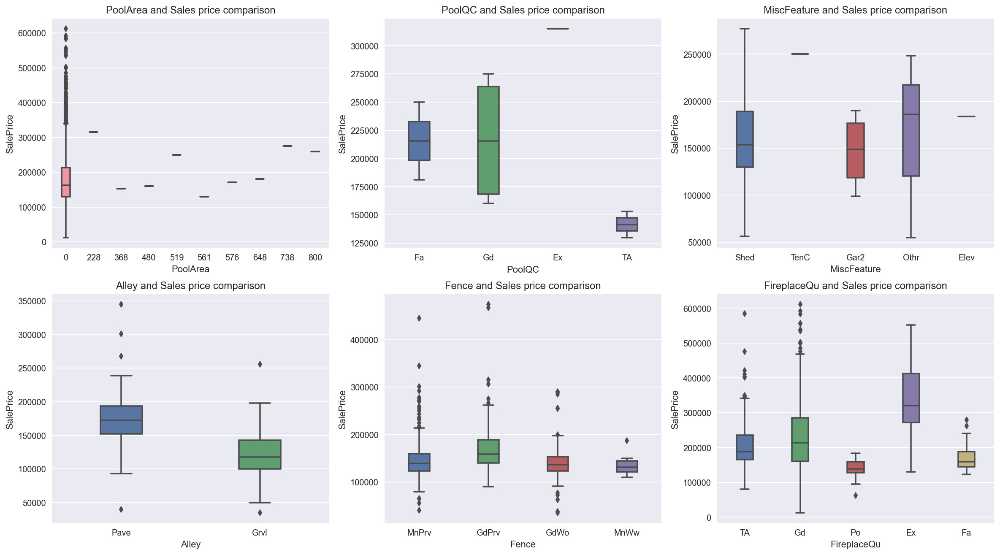

In [9]:
subplot_boxp(train, ['PoolArea', 'PoolQC', 'MiscFeature', 'Alley','Fence', 'FireplaceQu']);

In [10]:
# Need to check unique values, value count for each column with missing data
train['PoolQC'].value_counts()
# There are very few data points for valuable prediction later

Gd    4
Fa    2
TA    2
Ex    1
Name: PoolQC, dtype: int64

In [11]:
# all 2042 missing values in pool_qc is due to the respective home without pool area
train[(train.PoolArea ==0) & (train.PoolQC.isnull())][['PoolArea', 'PoolQC']]
# proceed to drop pool area and pool qc columns since 2042 out of 2051 homes are without homes. By having 9 salespice of homes 
# with pool will not have any conclusive price predicted for houses wih pool
# Pool Area has very high single points (0 Pool area) which makes i less useful for prediction

,PoolArea,PoolQC
0,0,NaN
1,0,NaN
2,0,NaN
3,0,NaN
4,0,NaN
5,0,NaN
6,0,NaN
7,0,NaN
8,0,NaN
9,0,NaN


In [12]:
# drop train.csv and test.csv for pool related features
train = train.drop(['PoolArea', 'PoolQC'], axis=1)
test = test.drop(['PoolArea', 'PoolQC'], axis=1)
# due to high single values for Poolarea and Pool Qc

In [13]:
# Need to check unique values, value count for each column with missing data
train['MiscFeature'].value_counts()
# There are very few data points for valuable prediction later
# Most likely high missing values is due to no Misc features in the houses
# Will proceed to drop this column

Shed    56
Gar2     4
Othr     3
Elev     1
TenC     1
Name: MiscFeature, dtype: int64

In [14]:
# drop train.csv and test.csv for MiscFeature
train = train.drop(['MiscFeature'], axis=1)
test = test.drop(['MiscFeature'], axis=1)

In [15]:
# Since Misc Feature is removed, it makes Misc Value redundant
# drop train.csv and test.csv for MiscVal
train = train.drop(['MiscVal'], axis=1)
test = test.drop(['MiscVal'], axis=1)

In [16]:
# Need to check unique values, value count for each column with missing data
train['Alley'].value_counts()
# There are very few data points for valuable prediction later
# Most likely high missing values is due to no Alley access to the property
# Will proceed to drop this column

Grvl    85
Pave    55
Name: Alley, dtype: int64

In [17]:
# drop train.csv and test.csv for Alley
train = train.drop(['Alley'], axis=1)
test = test.drop(['Alley'], axis=1)

In [18]:
# Need to check unique values, value count for each column with missing data
train['Fence'].value_counts()
# There are very few data points for valuable prediction later
# Most likely high missing values is due to no Fence to the property
# Will proceed to drop this column
# There is no correlation with sales price

MnPrv    227
GdPrv     83
GdWo      80
MnWw      10
Name: Fence, dtype: int64

In [19]:
# drop train.csv and test.csv for Alley
train = train.drop(['Fence'], axis=1)
test = test.drop(['Fence'], axis=1)

In [20]:
# Need to check unique values, value count for each column with missing data
train['FireplaceQu'].value_counts()
# There is significant available data. Hence will keep this FireplaceQu

Gd    523
TA    407
Fa     59
Po     31
Ex     31
Name: FireplaceQu, dtype: int64

In [21]:
# Need to check unique values, value count for each column with missing data
train[(train.FireplaceQu.isnull()) & (train.Fireplaces.notnull())][['FireplaceQu', 'Fireplaces']]
# Similar to pool area. Those missing values are due to no fireplace at the houses.
# Will proceed fill with NA

,FireplaceQu,Fireplaces
0,NaN,0
2,NaN,0
3,NaN,0
4,NaN,0
6,NaN,0
7,NaN,0
8,NaN,0
10,NaN,0
11,NaN,0
13,NaN,0


In [22]:
# Impute NA for on FireplaceQu for both test.csv and train.csv

cols = ['FireplaceQu']
for col in cols:
    train[col] = train[col].fillna(value='NA')
    test[col] = test[col].fillna(value='NA')

In [23]:
# plot the scatter plots to investigate continueous datas
def subplot_scatterp(dataframe, list_of_columns):
    nrows = int(np.ceil(len(list_of_columns)/3)) # Makes sure you have enough rows
    fig, ax = plt.subplots(nrows=nrows, ncols=3, figsize=(20, nrows*5.5)) # You'll want to specify your figsize
    ax = ax.ravel() # Ravel turns a matrix into a vector, which is easier to iterate
    for i, column in enumerate(list_of_columns): # Gives us an index value to get into all our lists
        sns.regplot(y=dataframe.SalePrice, x=dataframe[column],ax=ax[i])
        ax[i].set_title(column + " and Sales price comparison",fontsize=14)
        # Set titles, labels, etc here for each subplot

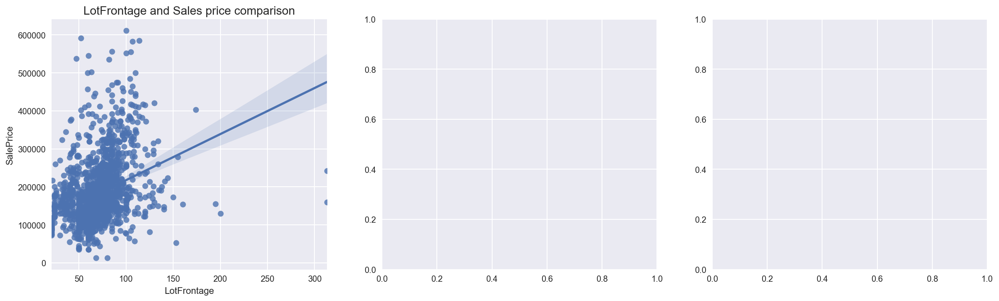

In [24]:
subplot_scatterp(train, ['LotFrontage'])

In [25]:
# Data points for LotFrontage is significant and hence will impute value based on neighbourhood for train.csv
median_lotfrt_per_nbhood = train["LotFrontage"].groupby(train["Neighborhood"])
for nbhood, grouped in median_lotfrt_per_nbhood:
    index = (train['Neighborhood'] == nbhood) & (train['LotFrontage'].isnull())
    train.loc[index,'LotFrontage'] = grouped.median()
    # for the few remaining rows from the neighborhoods without a median (i.e. if n < 3),
    # fill with overall lotfrontage median
train['LotFrontage'] = train['LotFrontage'].fillna(train['LotFrontage'].median())

In [26]:
# Data points for LotFrontage is significant and hence will impute value based on neighbourhood for test.csv
median_lotfrt_per_nbhood = test["LotFrontage"].groupby(test["Neighborhood"])
for nbhood, grouped in median_lotfrt_per_nbhood:
    index = (test['Neighborhood'] == nbhood) & (test['LotFrontage'].isnull())
    test.loc[index,'LotFrontage'] = grouped.median()
    # for the few remaining rows from the neighborhoods without a median (i.e. if n < 3),
    # fill with overall lotfrontage median
test['LotFrontage'] = test['LotFrontage'].fillna(test['LotFrontage'].median())

In [27]:
# Check null values for garage related features
train[(train.GarageFinish.isnull()) & (train.GarageArea.notnull())][['GarageArea', 'GarageFinish', 'GarageCond', 'GarageQual']]
# there is no garage the 113 rows

,GarageArea,GarageFinish,GarageCond,GarageQual
28,0.0,NaN,NaN,NaN
53,0.0,NaN,NaN,NaN
65,0.0,NaN,NaN,NaN
79,0.0,NaN,NaN,NaN
101,0.0,NaN,NaN,NaN
103,0.0,NaN,NaN,NaN
114,0.0,NaN,NaN,NaN
120,0.0,NaN,NaN,NaN
134,0.0,NaN,NaN,NaN
136,0.0,NaN,NaN,NaN


In [28]:
# remove row 1712 as there is a garage type but no garage information of any sorts
train[(train.GarageType.notnull()) & (train.GarageCond.isnull())][['GarageType', 'GarageCond']]
# This is a random error

,GarageType,GarageCond
1712,Detchd,NaN


In [29]:
# remove row 1712 as it is an random error
train.drop([1712], axis = 0, inplace=True)

In [30]:
# Impute NA for on Garage related for both test.csv and train.csv

cols = ['GarageArea','GarageFinish', 'GarageCond', 'GarageQual', 'GarageType']
for col in cols:
    train[col] = train[col].fillna(value='NA')
    test[col] = test[col].fillna(value='NA')

In [31]:
# drop GarageYrBlt column since it is collinear to house year-built. It is the condition of garage that matters
# drop train.csv and test.csv for Alley
train = train.drop(['GarageYrBlt'], axis=1)
test = test.drop(['GarageYrBlt'], axis=1)

In [32]:
# row 1147 has a Type 2 surface finish value of 470 but it doesnt have the bsmtfin_type_2 value.
train[(train.BsmtFinType2.isnull())& (train.BsmtFinType1.notnull())][['BsmtFinType2','BsmtFinType1', 'BsmtCond']]

,BsmtFinType2,BsmtFinType1,BsmtCond
1147,NaN,GLQ,TA


In [33]:
# remove row 1147 as it is an random error
train.drop([1147], axis = 0, inplace=True)

In [34]:
# There are 3 rows without BsmtExposure values but with BsmtFinType2 values.
# It could be due to it has no Exposure
train[(train.BsmtExposure.isnull())& (train.BsmtFinType1.notnull())][['BsmtFinType2','BsmtFinType1', 'BsmtCond']]
# Replace these 3 rows with these 3 rows with 'No' as per data description

,BsmtFinType2,BsmtFinType1,BsmtCond
1456,Unf,Unf,TA
1547,Unf,Unf,TA
1997,Unf,Unf,TA


In [35]:
# Impute these 3 rows w/o exposure but with Basement information as 'No exposure'
train.at[1456, 'BsmtExposure'] = 'No'
train.at[1547, 'BsmtExposure'] = 'No'
train.at[1997, 'BsmtExposure'] = 'No'

In [36]:
# replace those no basement houses with 'NA'
cols = ['BsmtFinType2','BsmtFinType1', 'BsmtExposure', 'BsmtCond', 'BsmtQual']
for col in cols:
    train[col] = train[col].fillna(value='NA')
    test[col] = test[col].fillna(value='NA')

In [37]:
# Since both Mas Vnr Type and Mas Vnr Area is null, it shows that they could be no Masonry veneer area
train[(train.MasVnrArea.isnull()) & (train.MasVnrType.isnull())][['MasVnrType', 'MasVnrArea']]
# Since test.cvs also has a missing value in MasVnrArea, i will proceed to impute 0s for MasVnrArea
# Impute MasVnrType to be 'None' since there is no Masonry veneer area

,MasVnrType,MasVnrArea
22,NaN,NaN
41,NaN,NaN
86,NaN,NaN
212,NaN,NaN
276,NaN,NaN
338,NaN,NaN
431,NaN,NaN
451,NaN,NaN
591,NaN,NaN
844,NaN,NaN


In [38]:
cols = ['MasVnrType']
for col in cols:
    train[col] = train[col].fillna(value='None')
    test[col] = test[col].fillna(value='None')

In [39]:
cols = ['MasVnrArea']
for col in cols:
    train[col] = train[col].fillna(value=0)
    test[col] = test[col].fillna(value=0)

In [40]:
# Remove all continueous basement values that are null since only 2 rows
train[train.isnull().any(axis=1)].head()

,Id,PID,MSSubClass,MSZoning,LotFrontage,LotArea,Street,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,OverallCond,YearBuilt,YearRemod/Add,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,FireplaceQu,GarageType,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,MoSold,YrSold,SaleType,SalePrice
616,1498,908154080,20,RL,123.0,47007,Pave,IR1,Lvl,AllPub,Inside,Gtl,Edwards,Norm,Norm,1Fam,1Story,5,7,1959,1996,Gable,CompShg,Plywood,Plywood,None,0.0,TA,TA,Slab,NA,NA,NA,NA,0.0,NA,0.0,0.0,0.0,GasA,TA,Y,SBrkr,3820,0,0,3820,NaN,NaN,3,1,5,1,Ex,11,Typ,2,Gd,Attchd,Unf,2.0,624.0,TA,TA,Y,0,372,0,0,0,7,2008,WD,284700
1327,1342,903230120,20,RM,99.0,5940,Pave,IR1,Lvl,AllPub,FR3,Gtl,BrkSide,Feedr,Norm,1Fam,1Story,4,7,1946,1950,Gable,CompShg,MetalSd,CBlock,None,0.0,TA,TA,PConc,NA,NA,NA,NA,NaN,NA,NaN,NaN,NaN,GasA,TA,Y,FuseA,896,0,0,896,NaN,NaN,1,0,2,1,TA,4,Typ,0,NA,Detchd,Unf,1.0,280.0,TA,TA,Y,0,0,0,0,0,4,2008,ConLD,79000


In [41]:
# remove row 616, 1327 as it is an random error
train.drop([616, 1327], axis = 0, inplace=True)

In [42]:
# sanity check. All null values imputed
# Compute number of columns with missing values for train.csv
null_col = train.isnull().sum().sort_values(ascending = False)
print("Number of columns with missing values: ", null_col[null_col > 0].count())

# Display column names with its number of missing values for train.csv
print("Display column names with its number of missing values as below:")
print(null_col[null_col > 0])
# compare against data describe later

Number of columns with missing values:  0
Display column names with its number of missing values as below:
Series([], dtype: int64)


In [43]:
test[test.isnull().any(axis=1)].head()

,Id,PID,MSSubClass,MSZoning,LotFrontage,LotArea,Street,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,OverallCond,YearBuilt,YearRemod/Add,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,FireplaceQu,GarageType,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,MoSold,YrSold,SaleType
635,1578,916386080,80,RL,73.0,9735,Pave,Reg,Lvl,AllPub,Inside,Gtl,Timber,Norm,Norm,1Fam,SLvl,5,5,2006,2007,Gable,CompShg,VinylSd,VinylSd,None,0.0,TA,TA,PConc,Gd,TA,No,Unf,0,Unf,0,384,384,GasA,Gd,Y,NaN,754,640,0,1394,0,0,2,1,3,1,Gd,7,Typ,0,NA,BuiltIn,Fin,2,400,TA,TA,Y,100,0,0,0,0,5,2008,WD


In [44]:
# I will impute this value with the mode() for electrical column
test.at[635, 'Electrical'] = 'SBrkr'

In [45]:
# After doing everything the same for test.csv, there is still 1 missing electric value
# Compute number of columns with missing values for test.csv
null_col_test = test.isnull().sum().sort_values(ascending = False)
print("Number of columns with missing values: ", null_col_test[null_col_test > 0].count())

# Display column names with its number of missing values or test.csv
print("Display column names with its number of missing values as below:")
print(null_col_test[null_col_test > 0])

Number of columns with missing values:  0
Display column names with its number of missing values as below:
Series([], dtype: int64)


**Summary for Null values**

Columns to be dropped due to less correlation observed, multicollinearity with other features, high missing data:
- garage yr_blt (collinearity with home year built)
- misc feature (lots of missing values)
- misc val (no correlation and mostly 0s)
- alley (lots of missing data and single values)
- pool quality (high missing values and high single values, low value for prediction)
- pool area (high single values, low value for prediction and removal of pool quality makes it redundant)
- Fence (high missing value, low chance a fence will add much value to the house)

Based on the [data dictionary](http://jse.amstat.org/v19n3/decock/DataDocumentation.txt), missing data can be due to facility not available for the particular home. Below are the columns with NA options:
1. Fireplace quality
2. Garage related columns('GarageArea','GarageFinish', 'GarageCond', 'GarageQual', 'GarageType')
3. Basement related columns('BsmtFinType2','BsmtFinType1', 'BsmtExposure', 'BsmtCond', 'BsmtQual')
4. Since both Mas Vnr Type and Mas Vnr Area is null, it shows that they could be no Masonry veneer

Remove rows with random errors:
1. row 1712 as there is a garage type but no garage information of any sorts
2. row 1147 has a Type 2 surface finish value of 470 but it doesnt have the bsmtfin_type_2 value.
3. row 161, 1327 Remove all continueous basement values that are null since only 2 rows
4. Impute test.csv row 635 with the mode() for electrical column

Impute data:
1. Lot Frontage. Median frontage of neighbourhood is used to impute lotfrontage of similar homes with null values. For houses without lotfrontage for the entire neighbourhood, it will be impute with median of the whole lot frontage column.
2. 3 rows without BsmtExposure values but with BsmtFinType2 values. Impute with 'No' for no exposure
3. Since both Mas Vnr Type and Mas Vnr Area is null, it shows that they could be no Masonry veneer area. Hence replace with 0

**Drop columns that are Redundant**
Utilities (mostly single values and all homes need utilities so it is redundant)

In [46]:
train = train.drop(['Utilities'], axis=1)
test = test.drop(['Utilities'], axis=1)

### Removal of outliers
Plot graph to visually check for outliers

In [47]:
# list with only numerical columns
col_numerical = [col for col in train.columns if train[col].dtype != np.object]

# list with only categorical columns
col_categorical = [col for col in train.columns if col not in col_numerical]

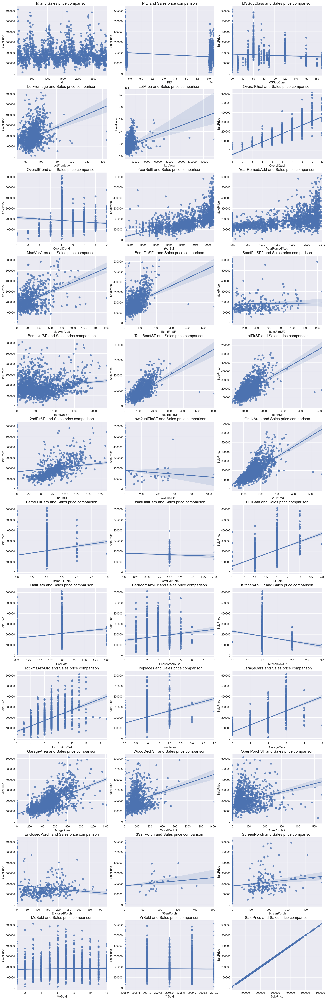

In [48]:
subplot_scatterp(train, col_numerical);

Outliers observed from the scatter plots, to be removed:
- lot_frontage (outliers above 170 sq ft)
- lot_area (outliers above 60000 sq ft)
- mas_vnr_area (outliers above 1400)
- bsmtfin_sf_2 (outlier above 1200)
- bsmtfin_sf_1 (outlier > 3500)
- 1st_flr_sf (outlier above 3000)
- gr_liv_area (outliers above 4000)
- low quality finish df (Outliers > 1000)

Outliers are define as:\
Q1 = quantile(0.25)\
Q3 = quantile(0.75)\
IQR = Q3 - Q1\
Outlier < (Q1 - 1.5 * IQR)) |(Outlier > (Q3 + 1.5 * IQR))\
Due to time constaints this is not able to be completed. Hence visual check is used to observe outliers in scatter plots

In [49]:
# Outliers
train[(train.LotFrontage > 170)|(train.LotArea > 60000)|(train.MasVnrArea > 1400)|(train.BsmtFinSF2 > 1200)|\
      (train.BsmtFinSF1 > 3500) | (train['1stFlrSF'] > 3000)|(train['GrLivArea'] > 4000)| (train['LowQualFinSF'] >1000)]

,Id,PID,MSSubClass,MSZoning,LotFrontage,LotArea,Street,LotShape,LandContour,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,OverallCond,YearBuilt,YearRemod/Add,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,FireplaceQu,GarageType,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,MoSold,YrSold,SaleType,SalePrice
328,1773,528366050,20,RL,88.5,12692,Pave,IR1,Lvl,Inside,Gtl,NoRidge,Norm,Norm,1Fam,1Story,8,5,1992,1993,Hip,CompShg,BrkFace,BrkFace,None,0.0,Gd,TA,PConc,Gd,TA,No,GLQ,1231.0,Unf,0.0,1969.0,3200.0,GasA,Ex,Y,SBrkr,3228,0,0,3228,1.0,0.0,3,0,4,1,Gd,10,Typ,1,Gd,Attchd,RFn,2.0,546.0,TA,TA,Y,264,75,291,0,0,5,2007,WD,430000
441,1639,527226040,190,RL,195.0,41600,Pave,IR1,Lvl,FR2,Gtl,Gilbert,Norm,Norm,2fmCon,1Story,5,5,1969,1990,Gable,CompShg,HdBoard,HdBoard,None,0.0,TA,TA,CBlock,Gd,TA,Gd,ALQ,1047.0,Unf,0.0,53.0,1100.0,GasW,TA,Y,SBrkr,1424,0,0,1424,1.0,0.0,1,1,3,1,TA,7,Mod,0,NA,2Types,Unf,3.0,828.0,TA,TA,N,144,0,0,0,0,11,2007,WD,155000
471,2116,906426060,50,RL,82.5,159000,Pave,IR2,Low,CulDSac,Sev,ClearCr,Norm,Norm,1Fam,1.5Fin,6,7,1958,2006,Gable,CompShg,Wd Sdng,HdBoard,BrkCmn,472.0,Gd,TA,CBlock,Gd,TA,Gd,Rec,697.0,Unf,0.0,747.0,1444.0,GasA,Gd,Y,SBrkr,1444,700,0,2144,0.0,1.0,2,0,4,1,Gd,7,Typ,2,TA,Attchd,Fin,2.0,389.0,TA,TA,Y,0,98,0,0,0,6,2007,WD,277000
694,2072,905301050,20,RL,82.5,115149,Pave,IR2,Low,CulDSac,Sev,ClearCr,Norm,Norm,1Fam,1Story,7,5,1971,2002,Gable,CompShg,Plywood,Plywood,Stone,351.0,TA,TA,CBlock,Gd,TA,Gd,GLQ,1219.0,Unf,0.0,424.0,1643.0,GasA,TA,Y,SBrkr,1824,0,0,1824,1.0,0.0,2,0,2,1,Gd,5,Typ,2,TA,Attchd,Unf,2.0,739.0,TA,TA,Y,380,48,0,0,0,6,2007,WD,302000
770,2093,906201200,60,RL,86.0,10380,Pave,IR1,Lvl,Inside,Gtl,SawyerW,Norm,Norm,1Fam,2Story,7,5,1986,1987,Gable,CompShg,Plywood,Plywood,BrkFace,172.0,Gd,TA,CBlock,TA,TA,Gd,LwQ,28.0,ALQ,1474.0,0.0,1502.0,GasA,Ex,Y,SBrkr,1553,1177,0,2730,1.0,0.0,2,1,4,1,Gd,8,Typ,1,TA,Attchd,Fin,2.0,576.0,TA,TA,Y,201,96,0,0,0,8,2007,WD,301000
828,661,535381040,50,RL,60.0,10410,Pave,Reg,Lvl,Inside,Gtl,OldTown,Norm,Norm,1Fam,1.5Fin,4,5,1915,1950,Gable,CompShg,MetalSd,MetalSd,None,0.0,TA,TA,BrkTil,TA,TA,No,Unf,0.0,Unf,0.0,1313.0,1313.0,GasA,TA,Y,SBrkr,1313,0,1064,2377,0.0,0.0,2,0,3,1,Gd,8,Min2,1,TA,Detchd,Unf,2.0,528.0,TA,TA,Y,0,0,432,0,0,6,2009,WD,142900
960,1499,908154235,60,RL,313.0,63887,Pave,IR3,Bnk,Corner,Gtl,Edwards,Feedr,Norm,1Fam,2Story,10,5,2008,2008,Hip,ClyTile,Stucco,Stucco,Stone,796.0,Ex,TA,PConc,Ex,TA,Gd,GLQ,5644.0,Unf,0.0,466.0,6110.0,GasA,Ex,Y,SBrkr,4692,950,0,5642,2.0,0.0,2,1,3,1,Ex,12,Typ,3,Gd,Attchd,Fin,2.0,1418.0,TA,TA,Y,214,292,0,0,0,1,2008,New,160000
1263,496,528321010,60,RL,174.0,15138,Pave,IR1,Lvl,Inside,Gtl,NoRidge,Norm,Norm,1Fam,2Story,8,5,1995,1996,Gable,CompShg,VinylSd,VinylSd,BrkFace,506.0,Gd,TA,PConc,Gd,TA,No,GLQ,689.0,Unf,0.0,773.0,1462.0,GasA,Ex,Y,SBrkr,1490,1304,0,2794,1.0,0.0,2,1,4,1,Ex,9,Typ,1,TA,Attchd,Fin,3.0,810.0,TA,TA,Y,0,146,202,0,0,7,2009,WD,403000
1335,1266,535427070,20,RL,313.0,27650,Pave,IR2,HLS,Inside,Mod,NAmes,PosA,Norm,1Fam,1Story,7,7,1960,2007,Flat,Tar&Grv,Wd Sdng,Wd Sdng,None,0.0,TA,TA,CBlock,Gd,TA,Gd,GLQ,425.0,Unf,0.0,160.0,585.0,GasA,Ex,Y,SBrkr,2069,0,0,2069,1.0,0.0,2,0,4,1,Gd,9,Typ,1,Gd,Attchd,RFn,2.0,505.0,TA,TA,Y,0,0,0,0,0,11,2008,WD,242000
1409,1850,533241030,60,FV,66.0,7399,Pave,IR1,Lvl,Inside,Gtl,Somerst,Norm,Norm,1Fam,2Story,7,5,1997,1998,Hip,CompShg,VinylSd,VinylSd,BrkFace,1600.0,Gd,TA,PConc,Gd,TA,No,BLQ,649.0,Unf,0.0,326.0,975.0,GasA,Ex,Y,SBrkr,975,975,0,1950,0.0,0.0,2,1,3,1,Gd,7,Typ,1,TA,Detchd,RFn,2.0,576.0,TA,TA,Y,0,10,0,0,198,6,2007,WD,239000


In [50]:
# remove above rows as there are either very big houses or outliers that will affect out model later
train.drop([328, 441, 828, 1263, 1692, 1854, 1875, 471, 694, 770, 960, 1335, 1409, 1885], axis = 0, inplace=True)

In [51]:
# output cleaned data to csv
train.to_csv('../data/train_clean.csv')
test.to_csv('../data/test_clean.csv')

## Exploratory Data Analysis

In [52]:
train.describe().T

,count,mean,std,min,25%,50%,75%,max
Id,2033.0,1.472001e+03,8.452359e+02,1.0,752.0,1477.0,2199.0,2930.0
PID,2033.0,7.133513e+08,1.886818e+08,526301100.0,528458150.0,535453160.0,907180040.0,924152030.0
MSSubClass,2033.0,5.710034e+01,4.283955e+01,20.0,20.0,50.0,70.0,190.0
LotFrontage,2033.0,6.866798e+01,1.971666e+01,21.0,60.0,70.0,80.0,160.0
LotArea,2033.0,9.806681e+03,4.885720e+03,1300.0,7500.0,9382.0,11475.0,57200.0
OverallQual,2033.0,6.107231e+00,1.419532e+00,1.0,5.0,6.0,7.0,10.0
OverallCond,2033.0,5.562715e+00,1.106587e+00,1.0,5.0,5.0,6.0,9.0
YearBuilt,2033.0,1.971699e+03,3.020579e+01,1872.0,1953.0,1974.0,2001.0,2010.0
YearRemod/Add,2033.0,1.984140e+03,2.104529e+01,1950.0,1964.0,1993.0,2004.0,2010.0
MasVnrArea,2033.0,9.647221e+01,1.680299e+02,0.0,0.0,0.0,157.0,1129.0


## Summary Statistics
There were 2051 houses data captured, for individual residential properties sold in Ames, IA from 2006 to 2010.
After cleaning, left with 2033 data points for analysis. Big houses were removed as outliers.

The statistics were described for the important features as below:
- Average total basement size is 1051 sq ft. The biggest size is almost 3 times the average, at 3094sq ft. The median is 992 sq feet, meaning it is common to have basements and around the size of 992 sq ft. Standard deviation is 420sqft.
- Ground living area average is 1489 sq feet. Largest size is 3672 sq feet. Most of the homes are at 1441 sq ft median (median). Smallest is 334 sq ft. Std dev is 478 sq ft.
- The garage area average is 471 sq ft, median at 480 sq ft. Largest is 1356 sq feet. Some homes doesnt have a garage.
- Average number of rooms in the house is 6, which is same as median. Highest number of room is 15. Lowest number of room is 2
- Average price for the homes is 181K, median is 162K, std dev is 78K. Highest price can reach 611K, lowest 12.7K. Most of the houses were priced from 129K (25 percentile) to 213K(75 percentile).
- Out of a scale of 10, most homes were sold are of scale quality 6.

Generally, most of the homes sold in Ames are 6 rooms, with lot frontage 69 ft, with basement size 1051 sq ft, ground living area around 1489 sq ft, with garage area  471 sq ft, prcing range around $162K - $181K, quality of homes slightly above average at 6.

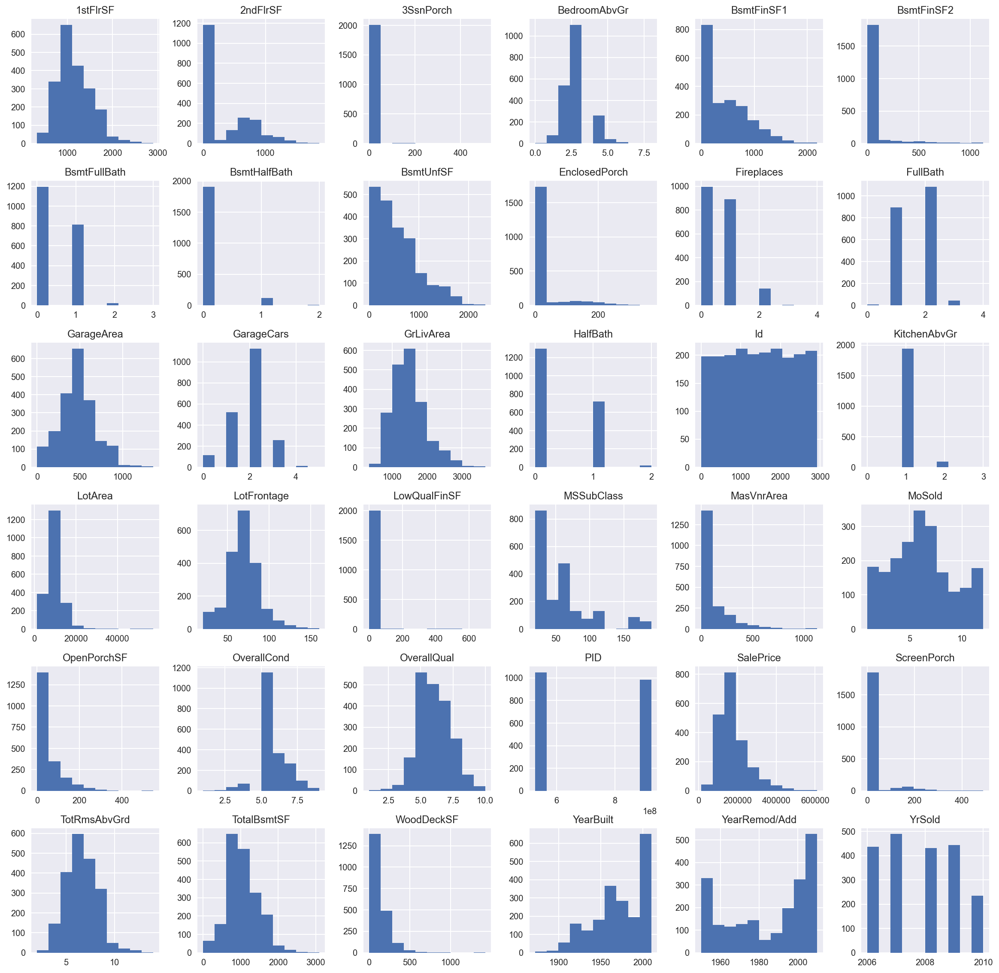

In [53]:
train.hist(figsize=(20, 20));

**House size is important to home buyer**\
Most of the home sold were skewed to the right for size, area related features. This shows that big luxury home wasnt so common or available in that area. It might also be less affordable for the population living area the area. More research needs to be done to confirm this point.

Left skewed (Median > Mean):
 - slight left skewed for overall quality. Overall quality of 6 is the most poular choice
 - year built. More houses available were built in the modern era
 
Right skewed (Mean > Median) and they are non normal distribution:
- sales price
- total basement sq ft
- total rooms above ground
- Garage area
- ground living area
- basement finished and unfinished sq ft
- first floor square ft

All the important features eg house size related features and sales prices are non normal distribution.

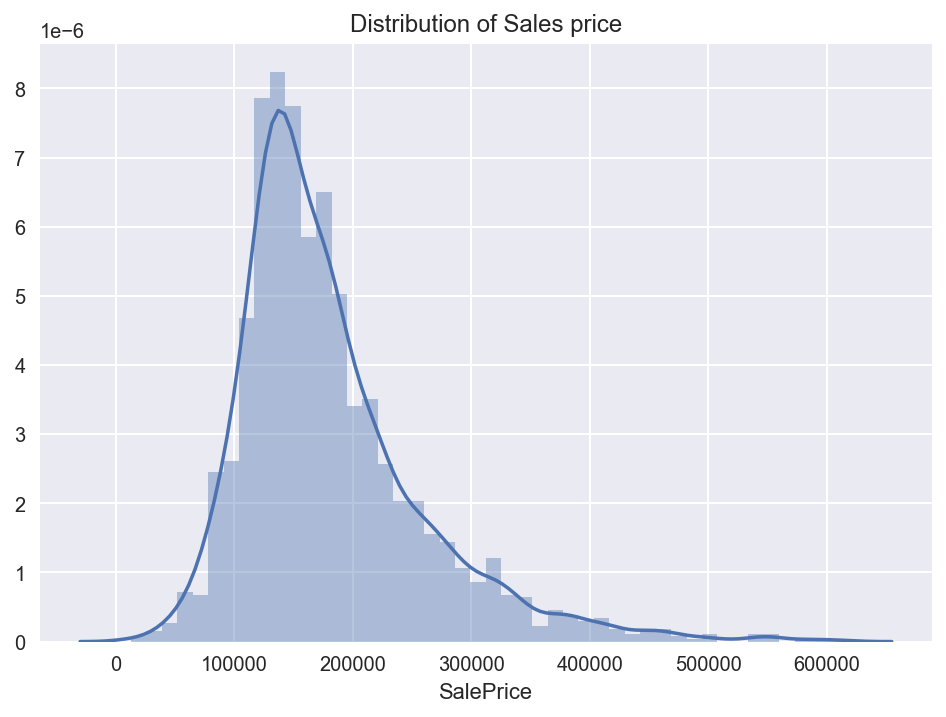

In [54]:
sns.distplot(train.SalePrice)
plt.title('Distribution of Sales price');

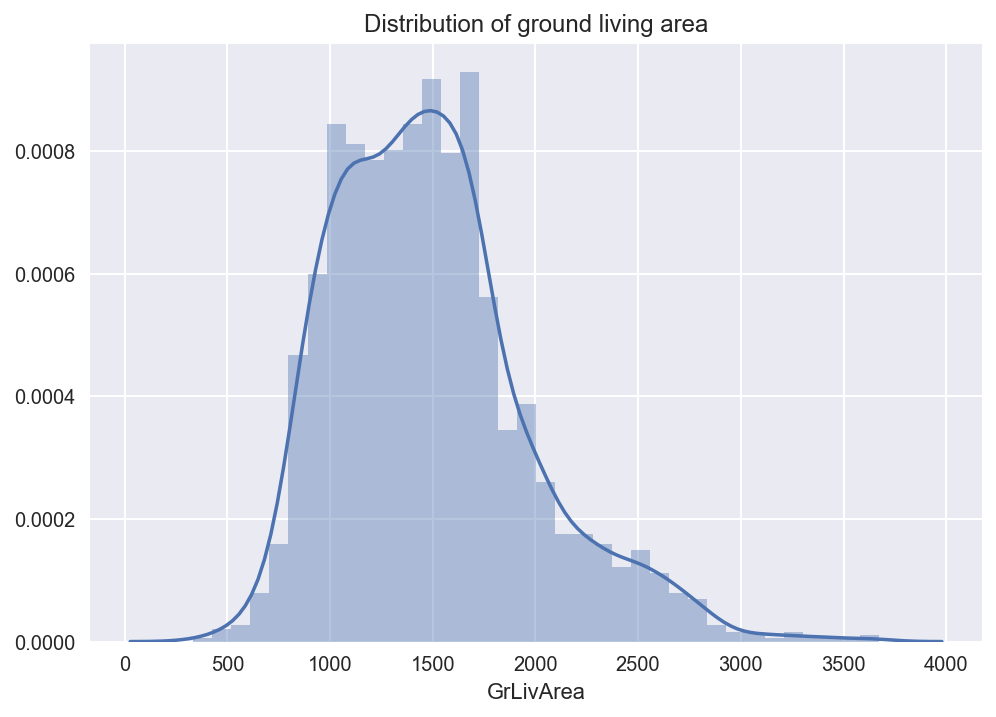

In [55]:
sns.distplot(train.GrLivArea)
plt.title('Distribution of ground living area');

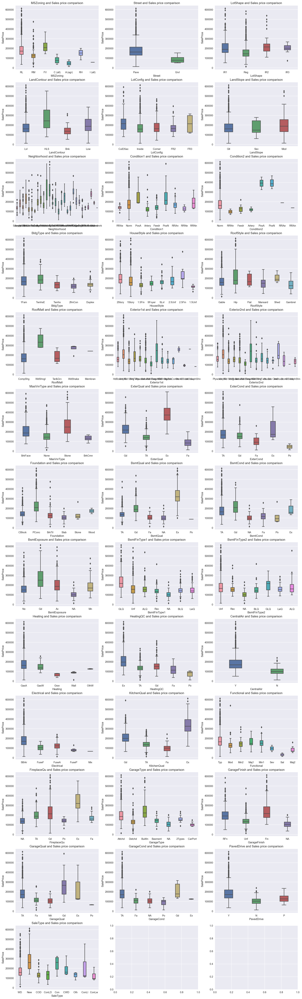

In [56]:
subplot_boxp(train, col_categorical);

**High Quality is valued by home buyer**\
From the boxplot, good to excellent quality is valued by home buyer as they are willing to pay more for better exterior, basement, fireplace, kitchen, roof, central air-conditioning, pavement and access to amenities.

Features were namely:

- Good to excellent garage quality
- Good garage condition
- Excellent fireplace quality
- Excellent kitchen quality
- With central air conditioning
- execellent basement quality
- Excellent exterior quality
- Roof material using WdShngi
- PosA and PosN of condition_2
- Neighbourhood

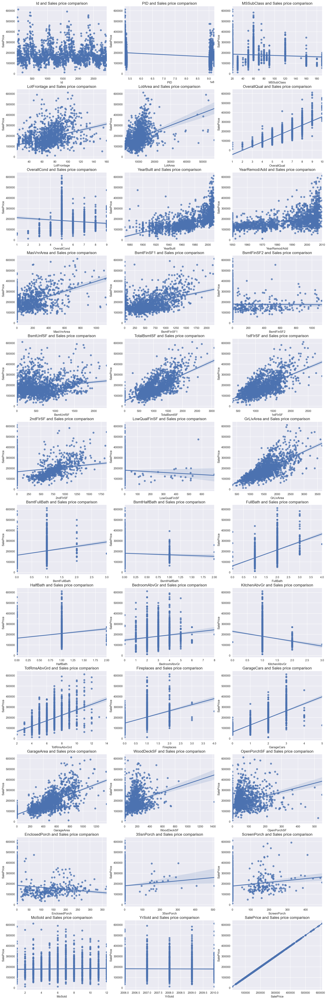

In [57]:
subplot_scatterp(train, col_numerical);

For scatter plot observations, linearity relationship observed between sales price and house size related features.
Discrete values features that have strong linear relationship with sales price:
1. Garage cars (size of garage in car capacity)
2. Total number of rooms above ground that does not include bathrooms
3. Number of full baths
4. Overall quality

Continueous values features which have strong linear relationship with sales price are:
1. Total basement sq ft
2. First floor sq ft
3. Garage area
4. Above ground living area in sq ft

We should explore in depth on sales price relaionship with size related features and quality features.

**Summary of boxplots, scatterplots, histograms**
In general, it was observed that there is linear relationship between sales price and size of the home. However, based on the histograms, you can see the linearity increase of sales price with home size will be limited, as the histograms were skewed mostly to the right. People are happy to purchase a home with a quality slightly above average at 6. Not so many will buy big and expensive home. This could be due to availability of the homes built at the area or related to the income of the population. More reaseach needs to confirm this point. People are more willing to buy homes that are in excellent conditions and with good building materials. Brand new house fetch the best price. Price dropped linearly as age increase, then plateau at around 45 years old. 

**Neighbourhood analysis**\
More homes and higher sales price seems to be sold from StoneBr and Northridge heights neighborhood. Most of the homes were sold from 100K to 200K

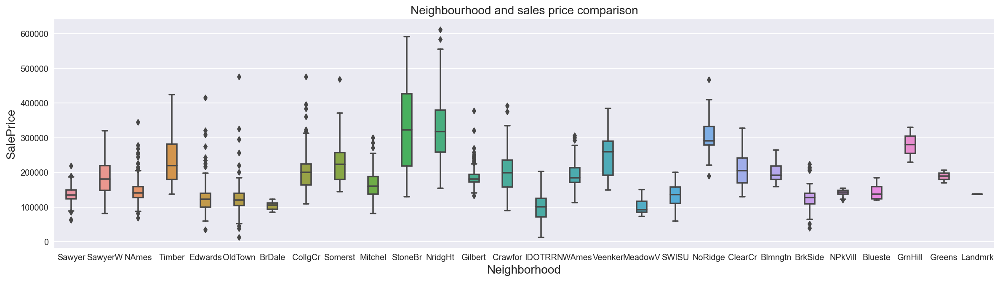

In [58]:
plt.figure(figsize=(20,5))
plt.xlabel("Neighbourhood", fontsize=14)
plt.ylabel("Sales price", fontsize=14)
plt.title("Neighbourhood and sales price comparison", fontsize=14)
sns.boxplot(x = train['Neighborhood'], y = train.SalePrice, width = 0.3);

Heatmap for Ames dataset


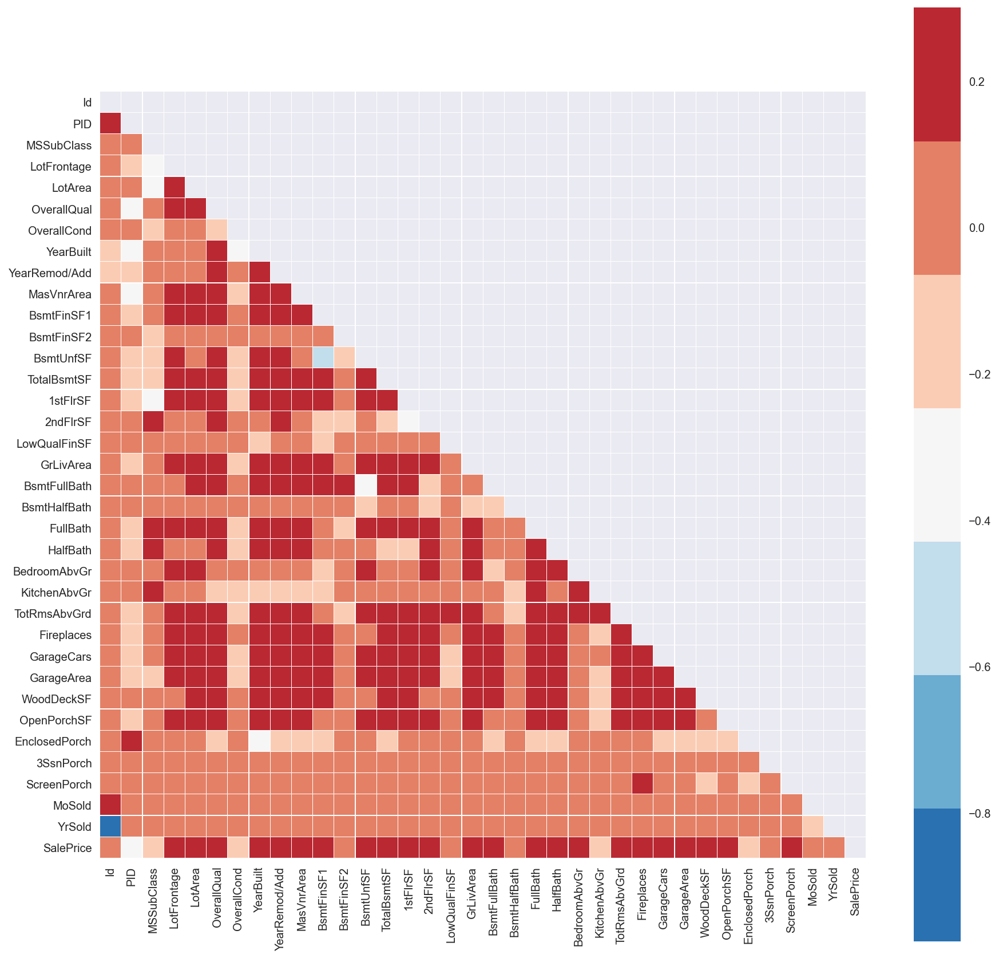

In [59]:
print("Heatmap for Ames dataset")
f, ax = plt.subplots(figsize=(15, 15))
mask = np.zeros_like(train.corr())
mask[np.triu_indices_from(mask)] = True

sns.heatmap(train.corr(), mask=mask, vmax=.3, linewidth=0.1, square=True, cmap=sns.color_palette("RdBu_r", 7));

**Overall quality has highest correlation with salesprice**\
**Below is the top 10 features with highest correlation with sales price:**\
Basically, quality, home age, garage size and ground living area is the most important to home buyers

In [60]:
# top 10 correlation features with sales price
train_co = train.corr().loc['SalePrice'].sort_values(ascending = False).iloc[1:].head(10)
train_co = train_co.to_frame()
train_co.rename(columns={'SalePrice':'Correlation to sales parice'}, inplace=True)
train_co

,Correlation to sales parice
OverallQual,0.806148
GrLivArea,0.716725
TotalBsmtSF,0.668167
GarageArea,0.657893
GarageCars,0.653004
1stFlrSF,0.650732
YearBuilt,0.576230
YearRemod/Add,0.553666
FullBath,0.532555
MasVnrArea,0.513939


In [61]:
# Cteate pairplot for top 10 most correlated to sales price:
train_pair = train.loc[:, ['OverallQual', 'GrLivArea', 'TotalBsmtSF', 'GarageArea', \
                           'GarageCars','1stFlrSF', 'YearBuilt', 'YearRemod/Add', \
                           'FullBath', 'MasVnrArea']]

Pairplot for 10 most correlated features
Wall time: 14.3 s


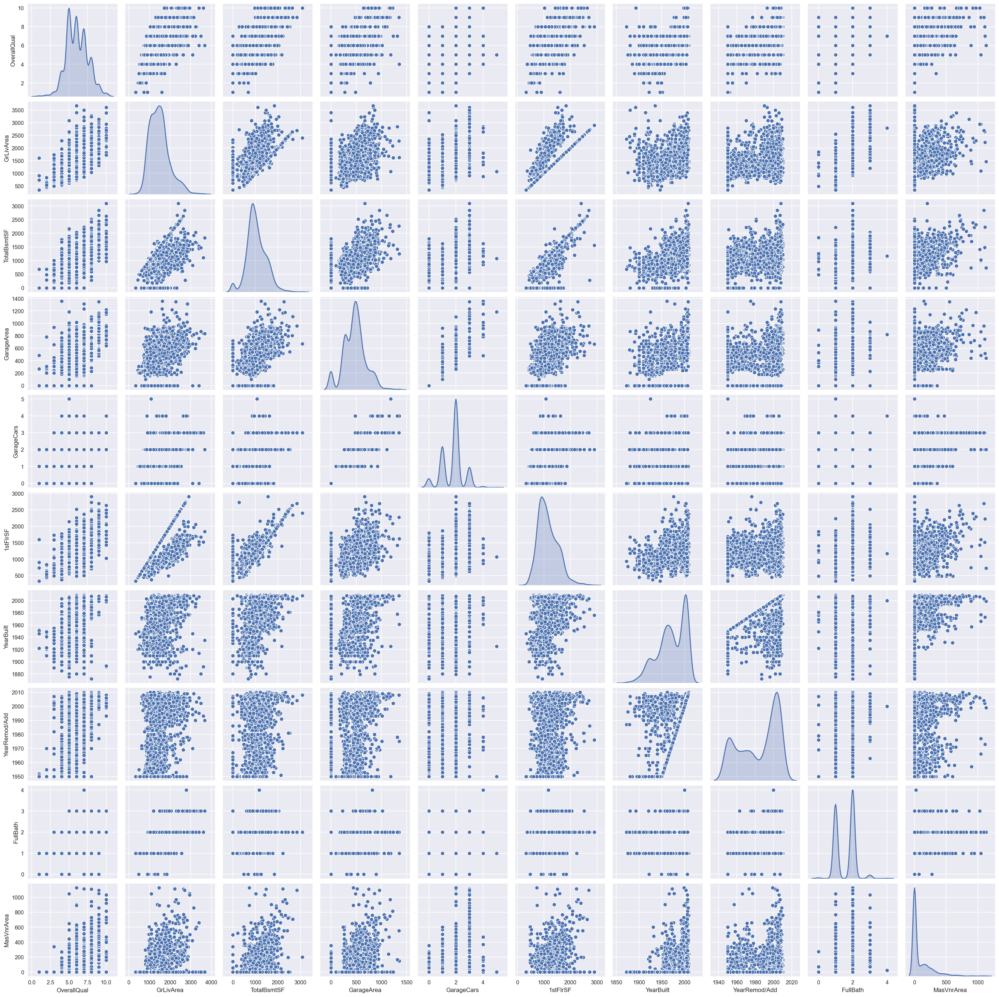

In [62]:
%%time
print("Pairplot for 10 most correlated features")
sns.pairplot(train_pair,kind ='scatter',diag_kind='kde');

## Preprocessing and Feature engineering

In [63]:
train.shape

(2033, 73)

In [64]:
test.shape

(879, 72)

### Plan for Preprocessing and Feature Engineering. Applies to both test.csv and train.csv
1. Feature engineering by investigate/manufacture features with linear relationships to the target
2. Replace selected ordinal categorical feature values with numeric representation for both test.csv and train.csv
4. get_dummies categorical features for both train.csv and test.csv
5. Remove categorical features dummies in train.csv that are not in test.csv. Since they were not in test.csv, there is no need to train and fit as there is no need for prediction.
6. Select features that has the highest correlations, highly inversely correlated, at the same time try to avoid choosing multicollinear features, using domain knowledge. 
7. Output train and test file

**1. Feature engineering by investigate/manufacture features with linear relationships to the target**

In [65]:
# From the plots above you can further combine the features.
# 1. You can include Age of the house into your dataset by subtracting the year sold - year built
train['Age'] = train['YrSold'] - train['YearBuilt']
test['Age'] = test['YrSold'] - test['YearBuilt']

# 2. Do the same for remodeled age
train['RemodeledAge'] = train['YearRemod/Add'] - train['YearBuilt']
test['RemodeledAge'] = test['YearRemod/Add'] - test['YearBuilt']

# drop year_built
train.drop(['YearBuilt', 'YearRemod/Add'], axis=1, inplace=True)
test.drop(['YearBuilt', 'YearRemod/Add'], axis=1, inplace=True)

In [66]:
# 3. House total living area
train['TotalLivArea'] = train['GrLivArea'] + train['TotalBsmtSF']
test['TotalLivArea'] = test['GrLivArea'] + test['TotalBsmtSF']

In [67]:
# 4. Total baths
train['TotalBath'] = train['FullBath'] + (train['HalfBath'] * .5) + train['BsmtFullBath'] + (train['BsmtHalfBath'] * .5)
test['TotalBath'] = test['FullBath'] + (test['HalfBath'] * .5) + test['BsmtFullBath'] + (test['BsmtHalfBath'] * .5)

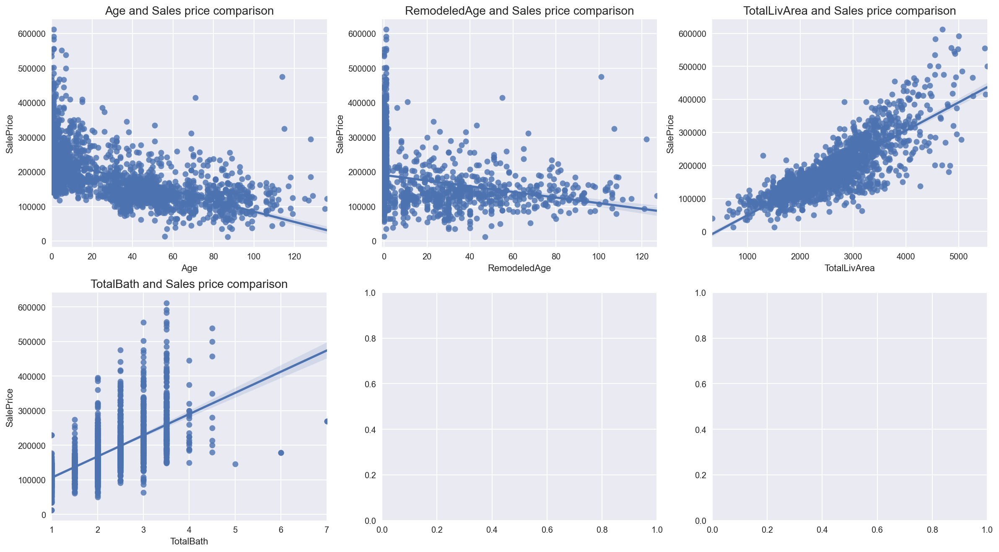

In [68]:
subplot_scatterp(train, ['Age', 'RemodeledAge', 'TotalLivArea', 'TotalBath'])
# better linear relationship observed after manufacturing the features

**2. Replace selected ordinal categorical feature values with numeric representation**

In [69]:
# Apply numbers to below selected ordinal categories
lotshape_dict = {'Reg': 0, 'IR1': 1, 'IR2': 2,'IR3': 3}
bsmtex_dict = {'NA': 0,'No': 1,'Mn': 2,'Av': 3,'Gd': 4}
qual_dict = {'Ex': 5,'Gd': 4,'TA': 3,'Fa': 2,'Po': 1,'None': 0, 'NA':0}

In [70]:
# for train.csv
train['LotShape'] = train['LotShape'].map(lotshape_dict)
train['BsmtExposure'] = train['BsmtExposure'].map(bsmtex_dict)
train['ExterQual'] = train['ExterQual'].map(qual_dict)
train['ExterCond'] = train['ExterCond'].map(qual_dict)
train['BsmtQual'] = train['BsmtQual'].map(qual_dict)
train['BsmtCond'] = train['BsmtCond'].map(qual_dict)
train['HeatingQC'] = train['HeatingQC'].map(qual_dict)  
train['GarageQual'] = train['GarageQual'].map(qual_dict)
train['GarageCond'] = train['GarageCond'].map(qual_dict)
train['KitchenQual'] = train['KitchenQual'].map(qual_dict)  
train['FireplaceQu'] = train['FireplaceQu'].map(qual_dict)

In [71]:
# for test.csv
test['LotShape'] = test['LotShape'].map(lotshape_dict)
test['BsmtExposure'] = test['BsmtExposure'].map(bsmtex_dict)
test['ExterQual'] = test['ExterQual'].map(qual_dict)
test['ExterCond'] = test['ExterCond'].map(qual_dict)
test['BsmtQual'] = test['BsmtQual'].map(qual_dict)
test['BsmtCond'] = test['BsmtCond'].map(qual_dict)
test['HeatingQC'] = test['HeatingQC'].map(qual_dict)  
test['GarageQual'] = test['GarageQual'].map(qual_dict)
test['GarageCond'] = test['GarageCond'].map(qual_dict)
test['KitchenQual'] = test['KitchenQual'].map(qual_dict)  
test['FireplaceQu'] = test['FireplaceQu'].map(qual_dict)

### One-hot encoding

**3. Get_dummies for categorical features for both train.csv and test.csv**\
Train dataset renamed to train_get_dummy\
Test dataset renamed to test_get_dummy

In [72]:
# One-hot encoded
train_get_dummy = pd.get_dummies(train, drop_first = True)
test_get_dummy = pd.get_dummies(test, drop_first = True)

In [73]:
# display list to show categorical features eg MSZoning were one-hot encoded
list(train_get_dummy.columns)

['Id',
 'PID',
 'MSSubClass',
 'LotFrontage',
 'LotArea',
 'LotShape',
 'OverallQual',
 'OverallCond',
 'MasVnrArea',
 'ExterQual',
 'ExterCond',
 'BsmtQual',
 'BsmtCond',
 'BsmtExposure',
 'BsmtFinSF1',
 'BsmtFinSF2',
 'BsmtUnfSF',
 'TotalBsmtSF',
 'HeatingQC',
 '1stFlrSF',
 '2ndFlrSF',
 'LowQualFinSF',
 'GrLivArea',
 'BsmtFullBath',
 'BsmtHalfBath',
 'FullBath',
 'HalfBath',
 'BedroomAbvGr',
 'KitchenAbvGr',
 'KitchenQual',
 'TotRmsAbvGrd',
 'Fireplaces',
 'FireplaceQu',
 'GarageCars',
 'GarageArea',
 'GarageQual',
 'GarageCond',
 'WoodDeckSF',
 'OpenPorchSF',
 'EnclosedPorch',
 '3SsnPorch',
 'ScreenPorch',
 'MoSold',
 'YrSold',
 'SalePrice',
 'Age',
 'RemodeledAge',
 'TotalLivArea',
 'TotalBath',
 'MSZoning_C (all)',
 'MSZoning_FV',
 'MSZoning_I (all)',
 'MSZoning_RH',
 'MSZoning_RL',
 'MSZoning_RM',
 'Street_Pave',
 'LandContour_HLS',
 'LandContour_Low',
 'LandContour_Lvl',
 'LotConfig_CulDSac',
 'LotConfig_FR2',
 'LotConfig_FR3',
 'LotConfig_Inside',
 'LandSlope_Mod',
 'LandSlope_

**4. Remove categorical features dummies in train.csv that are not in test.csv. Since they were not in test.csv, there is no need to train and fit as there is no need for prediction.**

In [74]:
# Generate the unique features created after train.csv and test.csv were one-hot encoded
# this list consist of features exist in train_get_dummy but not in test_get_dummy
unique_list = []

for x in train_get_dummy.columns: 
    # check if exists in unique_list or not 
    if x not in test_get_dummy.columns: 
        unique_list.append(x)

In [75]:
unique_list

['SalePrice',
 'MSZoning_C (all)',
 'Neighborhood_GrnHill',
 'Neighborhood_Landmrk',
 'Condition2_Feedr',
 'Condition2_RRAe',
 'Condition2_RRAn',
 'Condition2_RRNn',
 'RoofMatl_Membran',
 'Exterior1st_CBlock',
 'Exterior1st_ImStucc',
 'Exterior1st_Stone',
 'Exterior2nd_Stone',
 'Heating_OthW',
 'Heating_Wall',
 'Electrical_Mix',
 'Functional_Sal',
 'Functional_Sev']

In [76]:
# Generate the unique features created after train.csv and test.csv were one-hot encoded
# this list consist of features exist in test_get_dummy but not in train_get_dummy

unique_list_2 = []

for x in test_get_dummy.columns: 
    # check if exists in unique_list or not 
    if x not in train_get_dummy.columns: 
        unique_list_2.append(x)

In [77]:
unique_list_2

['RoofMatl_Metal',
 'RoofMatl_Roll',
 'Exterior1st_PreCast',
 'Exterior2nd_Other',
 'Exterior2nd_PreCast',
 'MasVnrType_CBlock',
 'Heating_GasA',
 'SaleType_VWD']

**Will proceed to drop all the unique columns created. Reason being:**\
**1. If the features does not exist in train file but in test file. There is no way we can model it**\
**2. If the feature does not exits in test but in train file, There is no point to model since we are not predicting it anyway**

In [78]:
train_get_dummy = train_get_dummy.drop(['MSZoning_C (all)',\
                                         'Neighborhood_GrnHill',\
                                         'Neighborhood_Landmrk',\
                                         'Condition2_Feedr',\
                                         'Condition2_RRAe',\
                                         'Condition2_RRAn',\
                                         'Condition2_RRNn',\
                                         'RoofMatl_Membran',\
                                         'Exterior1st_CBlock',\
                                         'Exterior1st_ImStucc',\
                                         'Exterior1st_Stone',\
                                         'Exterior2nd_Stone',\
                                         'Heating_OthW',\
                                         'Heating_Wall',\
                                         'Electrical_Mix',\
                                         'Functional_Sal',\
                                         'Functional_Sev'], axis=1)

In [79]:
test_get_dummy = test_get_dummy.drop(['RoofMatl_Metal',\
                                     'RoofMatl_Roll',\
                                     'Exterior1st_PreCast',\
                                     'Exterior2nd_Other',\
                                     'Exterior2nd_PreCast',\
                                     'MasVnrType_CBlock',\
                                     'Heating_GasA',\
                                     'SaleType_VWD'], axis=1)

In [80]:
train_get_dummy.shape

(2033, 193)

In [81]:
test_get_dummy.shape
# test.csv does not have sales price col

(879, 192)

**5. Select features that has the highest correlations, highly inversely correlated, at the same time try to avoid choosing multicollinear features, using domain knowledge.**

In [82]:
# Select top 20 highly co-related features for mode training
train_co_select = train_get_dummy.corr().loc['SalePrice'].sort_values(ascending = False).iloc[1:].head(20)
train_co_select = train_co_select.to_frame()
train_co_select.rename(columns={'SalePrice':'Correlation to sales price'}, inplace=True)
train_co_select

,Correlation to sales price
TotalLivArea,0.824173
OverallQual,0.806148
ExterQual,0.720115
GrLivArea,0.716725
KitchenQual,0.693266
TotalBsmtSF,0.668167
GarageArea,0.657893
GarageCars,0.653004
1stFlrSF,0.650732
TotalBath,0.627065


In [83]:
# select 'Age', 'GarageFinish_Unf', 'RemodeledAge', 'MSZoning_RM', 'MSZoning_RM' from the below list
train_co_select_inverse_related = train_get_dummy.corr().loc['SalePrice'].sort_values(ascending = False).iloc[1:].tail(10)
train_co_select_inverse_related = train_co_select_inverse_related.to_frame()
train_co_select_inverse_related

,SalePrice
GarageFinish_NA,-0.232339
RemodeledAge,-0.244282
RoofStyle_Gable,-0.247392
PID,-0.255730
MSZoning_RM,-0.281069
Foundation_CBlock,-0.360275
GarageType_Detchd,-0.370518
MasVnrType_None,-0.411934
GarageFinish_Unf,-0.435115
Age,-0.576088


**6. Prepare and output file**

In [84]:
train_final = train_get_dummy.loc[:, ['TotalLivArea', 'OverallQual', 'ExterQual', 'GrLivArea', 'KitchenQual', 'TotalBsmtSF', 'GarageArea',\
                   'GarageCars', '1stFlrSF', 'TotalBath', 'BsmtQual', 'FireplaceQu', 'Foundation_PConc', 'FullBath',\
                   'MasVnrArea', 'TotRmsAbvGrd', 'Fireplaces', 'BsmtFinType1_GLQ', 'HeatingQC', 'Neighborhood_NridgHt',\
                    'Age', 'GarageFinish_Unf', 'RemodeledAge', 'MSZoning_RM', 'MSZoning_RM', 'SalePrice']]

In [85]:
test_final = test_get_dummy.loc[:, ['TotalLivArea', 'OverallQual', 'ExterQual', 'GrLivArea', 'KitchenQual', 'TotalBsmtSF', 'GarageArea',\
                   'GarageCars', '1stFlrSF', 'TotalBath', 'BsmtQual', 'FireplaceQu', 'Foundation_PConc', 'FullBath',\
                   'MasVnrArea', 'TotRmsAbvGrd', 'Fireplaces', 'BsmtFinType1_GLQ', 'HeatingQC', 'Neighborhood_NridgHt',\
                    'Age', 'GarageFinish_Unf', 'RemodeledAge', 'MSZoning_RM', 'MSZoning_RM', 'Id']]

In [86]:
train_final.shape
# extra 1 column for salesprice

(2033, 26)

In [87]:
test_final.shape
# extra 1 column for Id

(879, 26)

In [88]:
# output cleaned data to csv
train_final.to_csv('../data/train_final_processed.csv')
test_final.to_csv('../data/test_final_processed.csv')

## Modelling

### StandardScaler

In [89]:
# define X and y
# only numerical columns can undergo the model fit
X = train_final.drop(['SalePrice'], axis=1)
y = train_final['SalePrice']

# Create X, y train and testing set
from sklearn.model_selection import train_test_split, cross_val_score
X_train, X_test, y_train, y_test = train_test_split(X, y, random_state=42)

# fit then transform to Scale the data for X 
from sklearn.preprocessing import StandardScaler
ss = StandardScaler()
ss.fit(X_train) # fit on X_train then apply the fit to test & train (transform)

# transform
X_train = ss.transform(X_train)
X_test = ss.transform(X_test)

### Create Baseline Regression Model

In [90]:
# Create a dummy regressor
dummy_mean = DummyRegressor(strategy='mean')
# "Train" dummy regressor
dummy_mean.fit(X_train, y_train)

DummyRegressor()

In [91]:
# Create a dummy regressor
dummy_constant = DummyRegressor(strategy='constant', constant=20)

# "Train" dummy regressor
dummy_constant.fit(X_train, y_train)

DummyRegressor(constant=array(20), strategy='constant')

In [92]:
# Get R-squared score
print("The baseline R2 value for test is:", dummy_constant.score(X_test, y_test))

The baseline R2 value for test is: -5.496309665745979


### Linear Regression Model

In [93]:
# create a model
lr = LinearRegression()

In [94]:
# fit to model
model = lr.fit(X_train,y_train)

scores = cross_val_score(model,X_train,y_train,cv=5)    
print('cvs:', scores)

print("Linear Regression Crossfold R2 mean: ", np.mean(scores))
print("Linear Regression Crossfold R2 std: ", np.std(scores))

rmse = np.sqrt(-cross_val_score(model, X_train, y_train, cv = 5, scoring = 'neg_mean_squared_error'))
print("Linear Regression RMSE is :", rmse.mean())
print("Linear Regression RMSE variance is: ", rmse.var())

cvs: [0.86214197 0.86188957 0.84042807 0.87311499 0.88003538]
Linear Regression Crossfold R2 mean:  0.8635219966294164
Linear Regression Crossfold R2 std:  0.013435894430584147
Linear Regression RMSE is : 28852.535226958164
Linear Regression RMSE variance is:  3569273.0457687476


In [95]:
# check the fit on test score
print('Validation accuracy on test size: ', model.score(X_test, y_test))

# predict on test data
y_pred = model.predict(X_test)
# evaluate model performance
rmse_test = np.sqrt(mean_squared_error(y_test, y_pred))
print('Linear Regression test RMSE: ', rmse_test)

Validation accuracy on test size:  0.865835279675676
Linear Regression test RMSE:  28808.799250469183


### Ridge Model

In [96]:
# example np.logspace(-3, 5, 10) means, you will try 10 alphas from 10**-3 up to 10**5.
ridge = RidgeCV(alphas=(np.logspace(-5, 5, 100)))
ridge.fit(X_train, y_train)
print("Ridge best alpha value is :", ridge.alpha_)
# Best alpha value is:

Ridge best alpha value is : 36.783797718286344


In [97]:
# training data metrics
print("Ridge R2 mean is :", np.mean(cross_val_score(ridge, X_train, y_train, cv=5)))
print("Ridge R2 std is :", np.std(cross_val_score(ridge, X_train, y_train, cv=5)))
rmse = np.sqrt(-cross_val_score(ridge, X_train, y_train, cv = 5, scoring = 'neg_mean_squared_error'))
print("Ridge RMSE is :", rmse.mean())
print("Ridge RMSE variance is: ", rmse.var())

Ridge R2 mean is : 0.8635155797811649
Ridge R2 std is : 0.013376950088325412
Ridge RMSE is : 28853.93341556438
Ridge RMSE variance is:  3573543.9602039554


In [98]:
# apply the fit to test set to check for validity
print('Validation accuracy on test size: ', ridge.score(X_test, y_test))
# Validity score of test set is very similar to the training set

Validation accuracy on test size:  0.8658716168903133


In [99]:
# predict on test data
y_pred = ridge.predict(X_test)
# evaluate model performance
rmse_test = np.sqrt(mean_squared_error(y_test, y_pred))
print('Ridge test RMSE: ', rmse_test)

Ridge test RMSE:  28804.897694195963


### Lasso Model

In [100]:
lasso = LassoCV()
lasso.fit(X_train, y_train)
print("Lasso alpha is:", lasso.alpha_)
# Best alpha value is:

Lasso alpha is: 64.84955711457543


In [101]:
print("Lasso R2 mean is: ", np.mean(cross_val_score(lasso, X_train, y_train, cv=5)))
print("Lasso std dev is: ", np.std(cross_val_score(lasso, X_train, y_train, cv=5)))

rmse = np.sqrt(-cross_val_score(lasso, X_train, y_train, cv = 5, scoring = 'neg_mean_squared_error'))
print("Lasso RMSE is :", rmse.mean())
print("Lasso RMSE variance is: ", rmse.var())

Lasso R2 mean is:  0.8635167667606656
Lasso std dev is:  0.013321029325542945
Lasso RMSE is : 28856.006964245666
Lasso RMSE variance is:  3648495.3119798987


In [102]:
# apply the fit to test set to check for validity
print('Validation test accuracy: ', lasso.score(X_test, y_test))

# predict on test data
y_pred = lasso.predict(X_test)
# evaluate model performance
rmse_test = np.sqrt(mean_squared_error(y_test, y_pred))
print('Lasso test RMSE: ', rmse_test)

Validation test accuracy:  0.865671210427021
Lasso test RMSE:  28826.408924139985


### Elastic net Model

In [103]:
%%time
# fit elasticCV model
n = np.linspace(0.01, 1, 20)
enet_alphas = np.arange(0.5, 1.0, 0.005)

elasticCV = ElasticNetCV(alphas=enet_alphas, l1_ratio=n, cv=5)
elasticCV.fit(X_train, y_train)

C:\Users\Hong Yee\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:525: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 67721116252.29468, tolerance: 752060874.8442367
  model = cd_fast.enet_coordinate_descent_gram(
C:\Users\Hong Yee\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:525: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 67713408031.608154, tolerance: 752060874.8442367
  model = cd_fast.enet_coordinate_descent_gram(
C:\Users\Hong Yee\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:525: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 67705802107.38599, tolerance: 752060874.8442367
  model = cd_fast.enet_coordinate_descent_gram(
C:\Users\Hong Yee\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_desce

Wall time: 5.28 s


C:\Users\Hong Yee\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:525: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 66819733763.19226, tolerance: 746249356.560274
  model = cd_fast.enet_coordinate_descent_gram(
C:\Users\Hong Yee\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:525: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 66811747444.9729, tolerance: 746249356.560274
  model = cd_fast.enet_coordinate_descent_gram(
C:\Users\Hong Yee\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:525: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 66803866656.21094, tolerance: 746249356.560274
  model = cd_fast.enet_coordinate_descent_gram(
C:\Users\Hong Yee\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py

ElasticNetCV(alphas=array([0.5  , 0.505, 0.51 , 0.515, 0.52 , 0.525, 0.53 , 0.535, 0.54 ,
       0.545, 0.55 , 0.555, 0.56 , 0.565, 0.57 , 0.575, 0.58 , 0.585,
       0.59 , 0.595, 0.6  , 0.605, 0.61 , 0.615, 0.62 , 0.625, 0.63 ,
       0.635, 0.64 , 0.645, 0.65 , 0.655, 0.66 , 0.665, 0.67 , 0.675,
       0.68 , 0.685, 0.69 , 0.695, 0.7  , 0.705, 0.71 , 0.715, 0.72 ,
       0.725, 0.73 , 0.735, 0.74 , 0.745, 0.75 , 0.755, 0.76 , 0.765,
       0.77 , 0.775, 0.78 , 0.785, 0.79 , 0....
       0.86 , 0.865, 0.87 , 0.875, 0.88 , 0.885, 0.89 , 0.895, 0.9  ,
       0.905, 0.91 , 0.915, 0.92 , 0.925, 0.93 , 0.935, 0.94 , 0.945,
       0.95 , 0.955, 0.96 , 0.965, 0.97 , 0.975, 0.98 , 0.985, 0.99 ,
       0.995]),
             cv=5,
             l1_ratio=array([0.01      , 0.06210526, 0.11421053, 0.16631579, 0.21842105,
       0.27052632, 0.32263158, 0.37473684, 0.42684211, 0.47894737,
       0.53105263, 0.58315789, 0.63526316, 0.68736842, 0.73947368,
       0.79157895, 0.84368421, 0.89578947, 0

In [104]:
# Here is the optimal value of alpha
enet_optimal_alpha = elasticCV.alpha_
print("Elastic Net opitmal alpha is:", enet_optimal_alpha)

Elastic Net opitmal alpha is: 0.5


In [105]:
print('Elastic Net R2 mean: ', np.mean(cross_val_score(elasticCV, X_train, y_train, cv=5)))
print('Elastic Net R2 std: ', np.std(cross_val_score(elasticCV, X_train, y_train, cv=5)))

C:\Users\Hong Yee\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:525: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 55489267185.50659, tolerance: 617803985.3893399
  model = cd_fast.enet_coordinate_descent_gram(
C:\Users\Hong Yee\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:525: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 55483214526.94275, tolerance: 617803985.3893399
  model = cd_fast.enet_coordinate_descent_gram(
C:\Users\Hong Yee\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:525: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 55477242056.13782, tolerance: 617803985.3893399
  model = cd_fast.enet_coordinate_descent_gram(
C:\Users\Hong Yee\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descen

C:\Users\Hong Yee\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:525: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 57660706191.72693, tolerance: 624345824.3566246
  model = cd_fast.enet_coordinate_descent_gram(
C:\Users\Hong Yee\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:525: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 57654917992.28296, tolerance: 624345824.3566246
  model = cd_fast.enet_coordinate_descent_gram(
C:\Users\Hong Yee\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:525: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 57649206787.07776, tolerance: 624345824.3566246
  model = cd_fast.enet_coordinate_descent_gram(
C:\Users\Hong Yee\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descen

C:\Users\Hong Yee\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:525: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 53396733315.221924, tolerance: 595631185.3466147
  model = cd_fast.enet_coordinate_descent_gram(
C:\Users\Hong Yee\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:525: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 53390336333.069824, tolerance: 595631185.3466147
  model = cd_fast.enet_coordinate_descent_gram(
C:\Users\Hong Yee\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:525: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 53384023845.71362, tolerance: 595631185.3466147
  model = cd_fast.enet_coordinate_descent_gram(
C:\Users\Hong Yee\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_desc

Elastic Net R2 mean:  0.8635931482121263


C:\Users\Hong Yee\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:525: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 55489267185.50659, tolerance: 617803985.3893399
  model = cd_fast.enet_coordinate_descent_gram(
C:\Users\Hong Yee\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:525: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 55483214526.94275, tolerance: 617803985.3893399
  model = cd_fast.enet_coordinate_descent_gram(
C:\Users\Hong Yee\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:525: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 55477242056.13782, tolerance: 617803985.3893399
  model = cd_fast.enet_coordinate_descent_gram(
C:\Users\Hong Yee\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descen

C:\Users\Hong Yee\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:525: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 62303954340.40503, tolerance: 651997117.8337471
  model = cd_fast.enet_coordinate_descent_gram(
C:\Users\Hong Yee\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:525: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 62298117994.474365, tolerance: 651997117.8337471
  model = cd_fast.enet_coordinate_descent_gram(
C:\Users\Hong Yee\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:525: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 62292358968.83923, tolerance: 651997117.8337471
  model = cd_fast.enet_coordinate_descent_gram(
C:\Users\Hong Yee\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_desce

C:\Users\Hong Yee\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:525: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 50811651087.38196, tolerance: 583278437.0962943
  model = cd_fast.enet_coordinate_descent_gram(
C:\Users\Hong Yee\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:525: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 50805687848.72803, tolerance: 583278437.0962943
  model = cd_fast.enet_coordinate_descent_gram(
C:\Users\Hong Yee\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:525: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 52312293475.56604, tolerance: 590055502.982547
  model = cd_fast.enet_coordinate_descent_gram(
C:\Users\Hong Yee\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent

Elastic Net R2 std:  0.013369825312324656


C:\Users\Hong Yee\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:525: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 55495441344.3988, tolerance: 609744588.4586061
  model = cd_fast.enet_coordinate_descent_gram(
C:\Users\Hong Yee\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:525: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 55489578170.107666, tolerance: 609744588.4586061
  model = cd_fast.enet_coordinate_descent_gram(
C:\Users\Hong Yee\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:525: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 55483793118.06152, tolerance: 609744588.4586061
  model = cd_fast.enet_coordinate_descent_gram(
C:\Users\Hong Yee\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descen

In [106]:
rmse = np.sqrt(-cross_val_score(elasticCV, X_train, y_train, cv = 5, scoring = 'neg_mean_squared_error'))
print("Elastic Net RMSE is :", rmse.mean())
print("Elastic Net RMSE variance is: ", rmse.var())

C:\Users\Hong Yee\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:525: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 55489267185.50659, tolerance: 617803985.3893399
  model = cd_fast.enet_coordinate_descent_gram(
C:\Users\Hong Yee\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:525: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 55483214526.94275, tolerance: 617803985.3893399
  model = cd_fast.enet_coordinate_descent_gram(
C:\Users\Hong Yee\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:525: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 55477242056.13782, tolerance: 617803985.3893399
  model = cd_fast.enet_coordinate_descent_gram(
C:\Users\Hong Yee\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descen

C:\Users\Hong Yee\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:525: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 57660706191.72693, tolerance: 624345824.3566246
  model = cd_fast.enet_coordinate_descent_gram(
C:\Users\Hong Yee\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:525: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 57654917992.28296, tolerance: 624345824.3566246
  model = cd_fast.enet_coordinate_descent_gram(
C:\Users\Hong Yee\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:525: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 57649206787.07776, tolerance: 624345824.3566246
  model = cd_fast.enet_coordinate_descent_gram(
C:\Users\Hong Yee\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descen

C:\Users\Hong Yee\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:525: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 52165814782.45203, tolerance: 592864002.8798363
  model = cd_fast.enet_coordinate_descent_gram(
C:\Users\Hong Yee\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:525: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 52159503740.81317, tolerance: 592864002.8798363
  model = cd_fast.enet_coordinate_descent_gram(
C:\Users\Hong Yee\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:525: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 52153276235.85895, tolerance: 592864002.8798363
  model = cd_fast.enet_coordinate_descent_gram(
C:\Users\Hong Yee\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descen

Elastic Net RMSE is : 28845.756091426545
Elastic Net RMSE variance is:  3571631.8203962343


C:\Users\Hong Yee\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:525: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 55495441344.3988, tolerance: 609744588.4586061
  model = cd_fast.enet_coordinate_descent_gram(
C:\Users\Hong Yee\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:525: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 55489578170.107666, tolerance: 609744588.4586061
  model = cd_fast.enet_coordinate_descent_gram(
C:\Users\Hong Yee\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:525: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 55483793118.06152, tolerance: 609744588.4586061
  model = cd_fast.enet_coordinate_descent_gram(
C:\Users\Hong Yee\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descen

In [107]:
# apply the fit to test set to check for validity
print('Validation test accuracy: ', elasticCV.score(X_test, y_test))
# Validity score of test set is very similar to the training set

# predict on test data
y_pred = elasticCV.predict(X_test)
# evaluate model performance
rmse_test = np.sqrt(mean_squared_error(y_test, y_pred))
print('Elastic Net test RMSE: ', rmse_test)

Validation test accuracy:  0.8658606506512219
Elastic Net test RMSE:  28806.0752038755


In [108]:
print("The value of elasticCV l1_ratio is:", elasticCV.l1_ratio_)

The value of elasticCV l1_ratio is: 0.9478947368421053


### Cross validation comparison

**Summary of all the metrics**\
The baseline Dummy Regessor model R2 value for test is: -5.496309665745979

Linear Regression Crossfold R2 mean:  0.8635219966294164\
Linear Regression Crossfold R2 std:  0.013435894430584147\
Linear Regression RMSE is : 28852.535226958164\
Linear Regression RMSE variance is:  3569273.0457687476\
Validation accuracy on test size:  0.865835279675676\
Linear Regression test RMSE:  28808.799250469183

Ridge best alpha value is : 36.783797718286344\
Ridge R2 mean is : 0.8635155797811649\
Ridge R2 std is : 0.013376950088325412\
Ridge RMSE is : 28853.93341556438\
Ridge RMSE variance is:  3573543.9602039554\
Validation accuracy on test size:  0.8658716168903133\
Ridge test RMSE:  28804.897694195963

Lasso alpha is: 64.84955711457543\
Lasso R2 mean is:  0.8635167667606656\
Lasso std dev is:  0.013321029325542945\
Lasso RMSE is : 28856.006964245666\
Lasso RMSE variance is:  3648495.3119798987\
Validation test accuracy:  0.865671210427021\
Lasso test RMSE:  28826.408924139985

Elastic Net opitmal alpha is: 0.5\
Elastic Net R2 mean:  0.8635931482121263
Elastic Net R2 std:  0.013369825312324656\
Elastic Net RMSE is : 28845.756091426545\
Elastic Net RMSE variance is:  3571631.8203962343\
Validation test accuracy:  0.8658606506512219\
Elastic Net test RMSE:  28806.0752038755\
The value of elasticCV l1_ratio is: 0.9478947368421053

**Observations:**
1. Standard deviation is low ~0.013 for all models.
2. R2 is around ~0.86 for all models.
3. Similar train and test R2 results for all models.
4. Simple linear regression has the lowest variance.
5. Generally, all the 4 models perform very similarly.

**Lasso was chosen because:**
1. Elastic Net L1_ratio is 0.94, almost fully lasso. This shows lasso is dominant to suppress overfitting than Ridge\
2. I tried running all models using test.csv. Kaggle gives Lasso the lowest RMSE score, slightly better than simple linear regression(both in ~33000 range). Ridge and elastic net gives similar RMSE score from kaggle ~33300

### Evaluation on selected best model (Lasso)

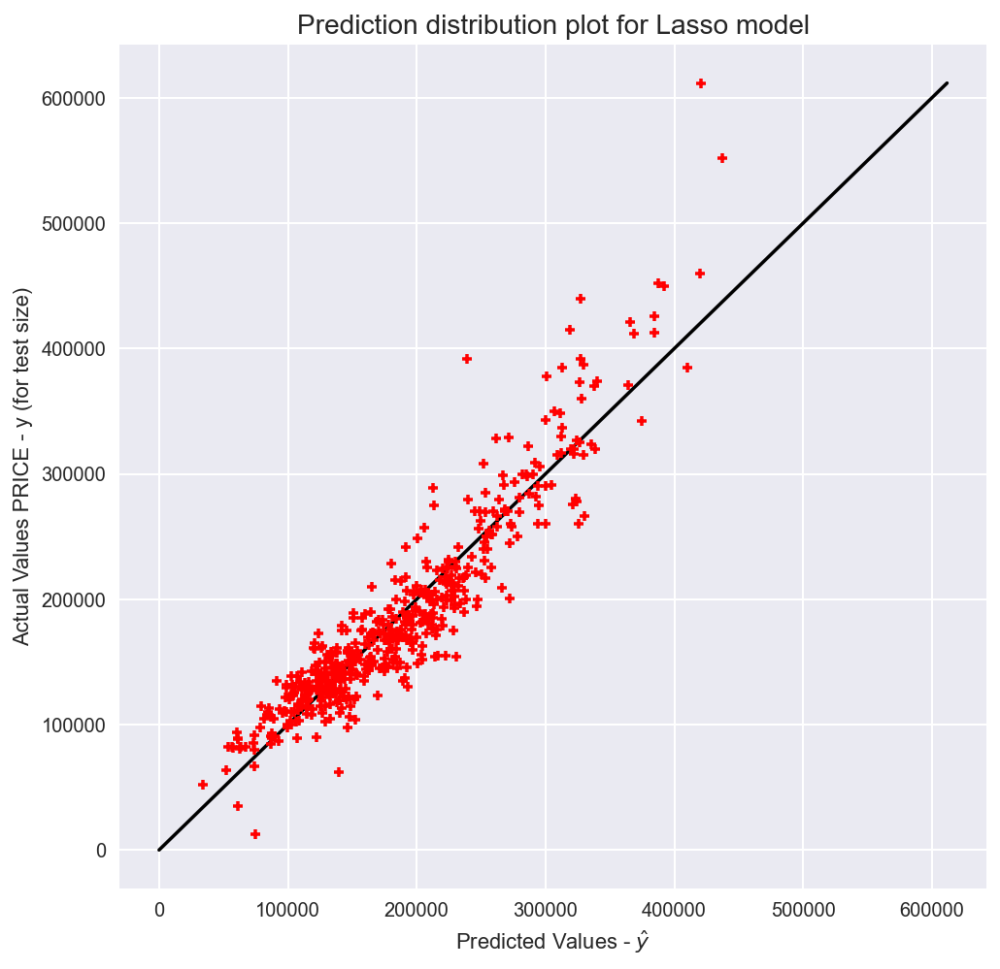

In [109]:
# Plot the Elastic Net model
y_pred = lasso.predict(X_test)
plt.figure(figsize=(8,8))
plt.scatter(y_pred, y_test, s=30, c='r', marker='+', zorder=10)
plt.xlabel("Predicted Values - $\hat{y}$")
plt.ylabel("Actual Values PRICE - y (for test size)")
plt.title('Prediction distribution plot for Lasso model', fontdict=None, loc='center', pad=None, fontsize=14);
plt.plot([0, np.max(y)], [0, np.max(y)], c = 'k')

plt.show()

**Further examination of the residual plot using the elastic net model shows equal distribution of variance, with the exception of a few points. The plot of predicted y against true y is also genreally linear with a 1:1 relationship, except for a few outliers.**

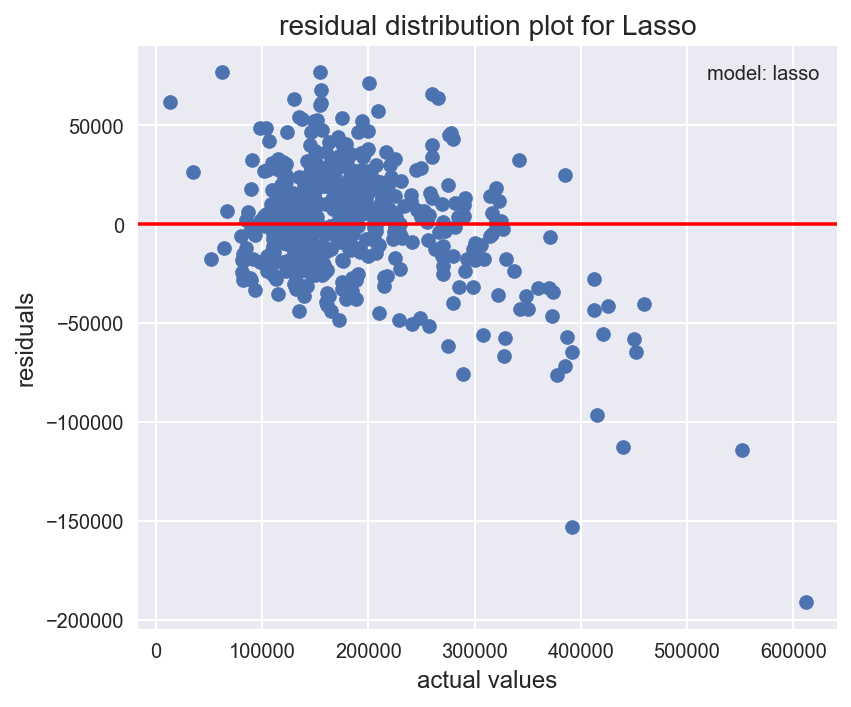

In [110]:
# plot residuals
resid = y_pred - y_test

plt.rcParams['figure.figsize'] = (6.0, 5.0)
plt.scatter(y_test, resid)
plt.axhline(0, linestyle='-', color='r')
plt.title('residual distribution plot for Lasso',fontsize=14)
plt.xlabel('actual values',fontsize=12)
plt.ylabel('residuals',fontsize=12)
plt.plot([], [], ' ', label="model: lasso")
plt.legend()
plt.tight_layout()

### Top 20 predictors based on Lasso model

In [111]:
# Obtain the column header names
coef_labels = [col for col in train_final.columns if col != 'SalePrice']

In [112]:
coef = sorted(abs(lasso.coef_), reverse=True)

In [113]:
# What are the most important predictors for how many housing prices?
# create DataFrame for the feature names
df = pd.DataFrame(coef_labels)
df.rename(columns={0:'features'}, inplace=True)
df = pd.merge(df, pd.DataFrame(coef), left_index=True, right_index=True)
df.rename(columns={0:'coefficient'}, inplace=True)
df = df.sort_values('coefficient', ascending = False)
df.head(21)

,features,coefficient
0,TotalLivArea,16939.187853
1,OverallQual,12960.984415
2,ExterQual,12531.901016
3,GrLivArea,9597.711783
4,KitchenQual,8807.257516
5,TotalBsmtSF,8177.674165
6,GarageArea,7567.183586
7,GarageCars,7362.041192
8,1stFlrSF,5270.084560
9,TotalBath,4884.607258


## Kaggle Submission

### Steps to generate sales price preduction for kaggle submission

In [114]:
# Sort test file by id
test_final = test_final.sort_values(by='Id')

In [115]:
# Remove Id column after sorting to prepare for prediction
test_final_2 = test_final.drop(['Id'], axis=1)
test_final_2

,TotalLivArea,OverallQual,ExterQual,GrLivArea,KitchenQual,TotalBsmtSF,GarageArea,GarageCars,1stFlrSF,TotalBath,BsmtQual,FireplaceQu,Foundation_PConc,FullBath,MasVnrArea,TotRmsAbvGrd,Fireplaces,BsmtFinType1_GLQ,HeatingQC,Neighborhood_NridgHt,Age,GarageFinish_Unf,RemodeledAge,MSZoning_RM,MSZoning_RM
704,1778,5,3,896,3,882,730,1,896,1.0,3,0,0,1,0.0,5,0,0,3,0,49,1,0,0,0
706,4220,7,4,2110,5,2110,522,2,2110,3.5,3,3,0,2,0.0,8,2,0,5,0,42,0,0,0,0
120,2530,6,3,1604,4,926,470,2,926,2.5,3,4,1,2,20.0,7,1,1,5,0,12,0,0,0,0
312,2676,8,4,1338,4,1338,582,2,1338,3.0,4,0,1,2,0.0,6,0,1,5,0,9,0,0,0,0
401,2311,8,4,1752,3,559,492,2,1080,2.0,4,0,0,2,0.0,8,0,1,4,0,22,0,17,0,0
316,3712,9,4,1856,5,1856,834,3,1856,2.5,5,5,1,1,350.0,8,1,1,5,0,0,0,0,0,0
791,2226,7,3,1173,4,1053,528,2,1173,3.0,4,3,0,2,81.0,6,2,1,3,0,36,0,0,0,0
608,1764,4,3,882,3,882,525,2,882,2.0,3,0,0,1,0.0,4,0,0,3,0,40,0,0,0,0
391,1617,5,3,1092,3,525,320,1,525,1.5,3,0,0,1,492.0,6,0,0,3,0,39,1,0,1,1
753,2311,6,3,1456,3,855,440,2,855,2.5,4,3,0,2,0.0,7,1,0,2,0,32,1,0,0,0


In [116]:
# StandardScaler to scale test file
test_final_1 = ss.transform(test_final_2)

In [117]:
# Make predictions The predictions shoould be in accordance to Id sorted previously
ypred = lasso.predict(test_final_1)

In [118]:
# Form a dataframe and append name to columns
export = pd.DataFrame({'Id': test_final['Id'], 'SalePrice': ypred})

In [119]:
# output cleaned predicted data to csv
export.to_csv('../data/submissions_16092020.csv', index =False)

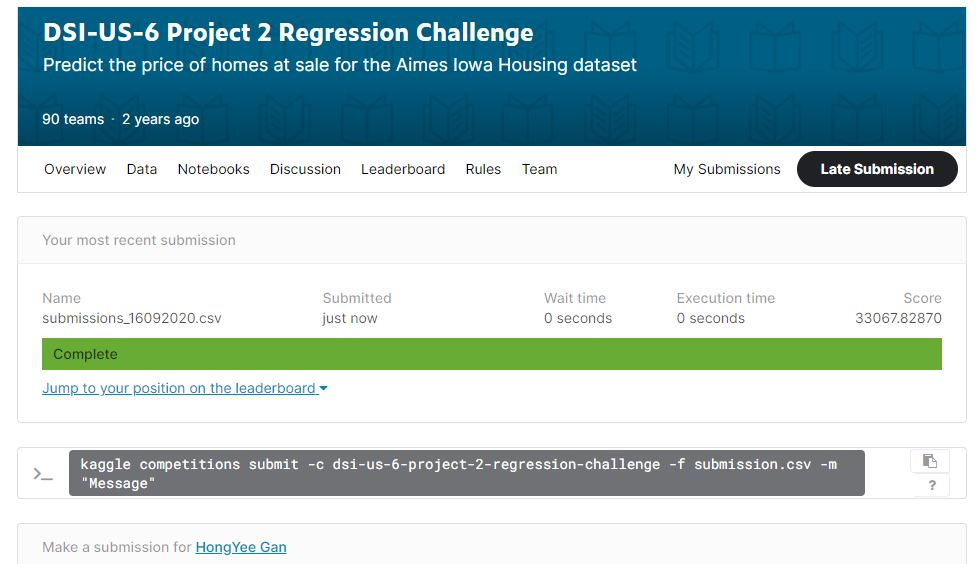

In [120]:
# Kaggle submited RMSE is 33,067
PATH = "../image/" 
Image(filename = PATH + "kaggle_hy.JPG")

## Outside Research
**1.** Selling price of most of the homes sold were skewed to the right for size and area related features. This shows that big luxury home wasnt so common/available or in demand in Ames. Since housing price is largely impacted by economic climate of the area, employment, salary and demographics, we should see these factors, other than just home features affecting house sales price. Outside research found that the most common employment industry in Ames is educational servies, whereby postsecondary teacher is the most common job. 

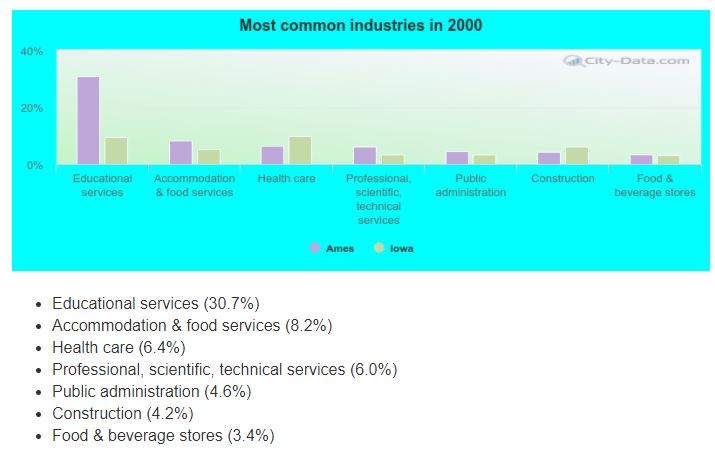

In [121]:
# Most common occupation in Ames
PATH = "../image/" 
Image(filename = PATH + "Most common industries in Ames.JPG")

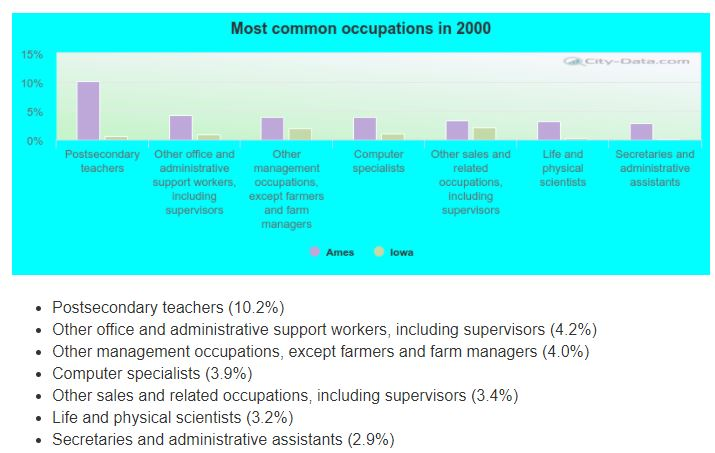

In [122]:
# Most common occupation in Ames
PATH = "../image/" 
Image(filename = PATH + "Most common occupation.JPG")

**2. Dive into Northridge heights neighbourhood**

As of year 2020, North Ridge Heights is a popular neighborhood, for home buyers who can afford to buy a home in the median price range of $390K. This median increases from $317K in 2006~2010.

Why Northridge heights?

- There are currently 4 schools in North Ridge Heights, which includes 2 elementary schools, 1 middle school, 1 high school and no private & charter schools. This creates a condusive and convenient environment for families with children for learning.
- Its population growth (since 2000) is 523%. This shows that people are moving to this area and also choose this neighbourhood to live.
- Nearby to Northridge Heights Park, which serves as leisure entertainment such as Basketball Courts, grills, playground, pinic area etc for people living in that area .
- This area is also suitable for retirement. There is Northridge village which enable independent living for seniors
- The crime rate index in Northridge heights is below national average except for burglary. Low crime rate is important for home buying choice in US as people have access to weapons easily.

Crime rate in Northridge Heights:


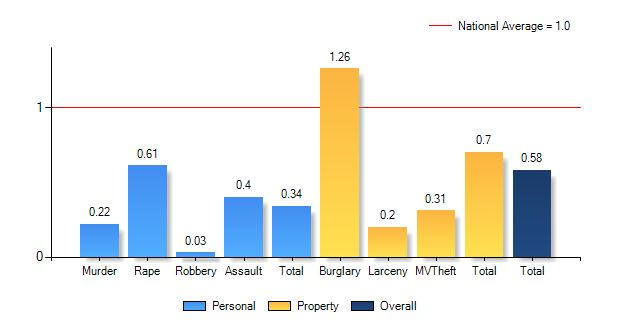

In [123]:
# Crime rate research for Northridge heights
print("Crime rate in Northridge Heights:")
PATH = "../image/"
Image(filename = PATH + "crimerate.JPG")

**3. Deep dive into heating quality**\
Heating quality is one of the important feature in our top predictors. This is due to Ames county experience severely cold winters, about 6 months in a year. Temperature start to drop in October and ends in Spring in march. Ames averages 30 inches of snow per year. The US average is 28 inches of snow per year. The cold weather drives the price of homes with better heating quality up. 

**References:**\
[Home values in North Ridge Heights](url:https://www.realtor.com/realestateandhomes-search/North-Ridge-Heights_Ames_IA/overview)\
[Weichart](url:https://www.weichert.com/search/community/neighborhood.aspx?hood=60290)\
[City of Ames](url:https://www.cityofames.org/government/departments-divisions-i-z/parks-recreation/employment-opportunities)\
[Ames, Iowa](url:http://www.city-data.com/city/Ames-Iowa.html)\
[Appreciation rate trends and housing market data](url:https://www.neighborhoodscout.com/ia/real-estate)

## Conclusion and Recommendation

### Conclusion

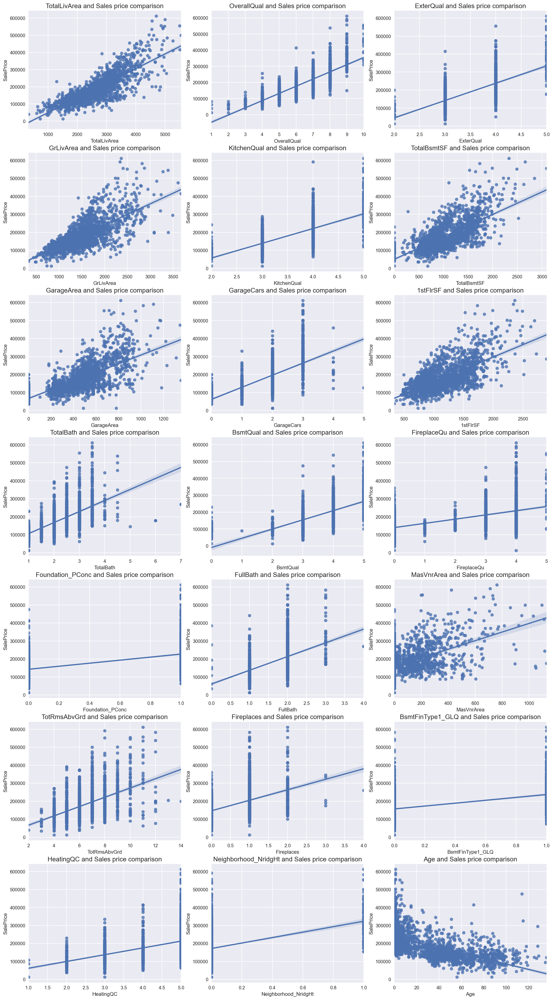

In [124]:
predictors_list = list(df.head(21)['features'].values)
subplot_scatterp(train_final, predictors_list);

Lets recap our problem statement!

**What are the features that will value-add a home and increase its sales price?**\
Based on our top 20 prodictors, we see total living area (basement + ground area) and garage area size being valued. Features like number of fireplaces, number of rooms, number of baths, with masonary veneer area and poured concrete foundation are important to buyers too. Overall house quality, kitchen quality, exterior quality, best basement finishing will also increase sales price. Better heating quality helped to increase the price due to severe winters in Ames county.

Brand new house fetch the best price. Price dropped linearly as age increase.
In specific, need to mention Northridge heights neighbourhood is the most popular choice and reasons were stated under research section.

**The predicted sales price of a home if a combination of features is given?**\
This is achieved by Kaggle competition submission whereby a test.csv containing its features were provided to predict the sales price using selected prediction model by the contestant. The model predicted sales prices were then feed into kaggle and compared against the actual. Kaggle will return the RMSE score based on actual sales price. My RMSE score is 33067. Further fine tuning eg data cleaning, reduce multi-collinearity, feature engineering and feature selection can be done to improve the scoring.

Model selected was lasso model. Standard deviation is low ~0.013. R2 is around ~0.86. Generally, all 4 models created perform very similarly. Lasso was chosen because it gives the best RMSE score on kaggle contest among the 4 models. Observed that elastic net has l1_ratio of 0.94. This shows lasso is dominant to suppress overfitting than Ridge.

**Predict feature combinations based on a given budget?**\
With the given budget, one can look up [Top 20 predictors based on Lasso model](#Top-20-predictors-based-on-Lasso-model). We can work backwards since we have the budget y and coefficient, to obtain various X features measurement in combinations. Example, the coefficient of overall quality is $12960.98, which means for every increase of 1 unit in overall quality, the price of the home will increase by 12960.98. By combining those features of interest and multiply by respective coefficients, we can obtain the sales price of a home within our budget

As mentioned, in [Outside Research](#Outside-Research), sales price is highly impacted by economic climate, salary, occupation, employment rate, population demographics etc. Wider feature types is needed to be collected for more accurate real like prediction.

Dataset scope is from 2006 to 2010, the prediction will be outdated for real life application. More recent dataset will be needed for current predictions.

Prediction is limited to Ames housing neighbourhood only. As the training dataset does not include other housing neighbourhood.

**Summary**
- Problem statement was established.
- Data importing, data inspection for duplicates, value counts, data types were done.
- Cleaning was performed to analyze and deal with the null values, feature by feature. Outliers were removed.
- Summary Statistics was done using describe, visualization of boxplot, scatter plots, histograms, distribution charts to examine the features. Analyzed neighbourhood in detail. Identified correlation on home size, quality, garage, age of house.
- Preprocessing and featuire engineering to combine size, age, baths related features together. Performed one hot encoding to for modeling on categorical features.
- Created baseline model + 4 different linear regression models (linear regression, lasso, elastic net, ridge)
- Analyze the metrics and concluded lasso is the best model. Plotted residual and prediction scatter plot
- Submitted Kaggle of ~33000 RMSE score
- Identified the top 20 predictors/most important features that increase sales price

### Recommendation

**1. Home buyers**\
Bigger homes, poured concrete foundation, new homes, Northridge heights neighbourhood, with a masonary veneer area, bigger garage, bigger basement, more fireplaces will be more expensive. The prediction model can help to save time during house hunting and to ensure buyer did not overpay for a house. In addition, home buyers can also use the model to work out features of interest alongside with their budget constraints.

**2. Home owners**\
It was recommended to improve the home quality for the exterior, kitchen, fireplace, by renovating if the house is of bad condition or rundown. Repair the heating as well if it is not working. Repaint the walls if needed. Maintain the home to at least functioning condition. Remodelling can also be done to increase the living area.

**3. Property agents**\
Property agent can use my model to recommend appropriate homes that is within buyer's budget. This will save time for the client during house hunting. Property agent can also use the model to present the selling/buying price to clients, so convince them that the price is reasonable. This can help to close deals at a faster rate.